In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 稍后训练模型会用到
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [5]:
import pandas as pd
import numpy as np

# 读取文件（使用你提供的正确路径）
file_path = r"C:\Users\TR\Desktop\Postgraduate\Paper\EAB\shuju\shuju.xlsx"
df = pd.read_excel(file_path)

# 查看基本信息
print("数据形状:", df.shape)
print("\n列名：", df.columns.tolist())
print("\n前5行:")
print(df.head())
print("\n数据类型:")
print(df.dtypes)

数据形状: (529, 4)

列名： ['outdoor', 'indoor', 'target', 'time']

前5行:
   outdoor  indoor  target  time
0    24.88   26.49      24     9
1    26.32   26.23      24     7
2    24.47   26.66      24     8
3    24.56   26.98      24     7
4    24.15   25.86      24     7

数据类型:
outdoor    float64
indoor     float64
target       int64
time         int64
dtype: object


In [6]:
# 统计缺失值
print("缺失值数量：")
print(df.isnull().sum())

# 如果有缺失值，可以选择删除或填充
# 这里假设数据完整，如果存在缺失则删除所在行
df = df.dropna()
print(f"删除缺失值后数据形状: {df.shape}")

缺失值数量：
outdoor    0
indoor     0
target     0
time       0
dtype: int64
删除缺失值后数据形状: (529, 4)


In [7]:
# 统计描述
print("\n描述性统计：")
print(df.describe())

# 检查 time 是否为正数
if (df['time'] <= 0).any():
    print("警告：存在 <=0 的时间值，将删除这些行")
    df = df[df['time'] > 0]

# 检查温度是否在合理范围（比如 -30~50 摄氏度，根据实际情况调整）
temp_cols = ['outdoor', 'indoor', 'target']
for col in temp_cols:
    if (df[col] < -30).any() or (df[col] > 50).any():
        print(f"警告：{col} 列存在异常温度值")
        # 可以选择过滤，这里暂不过滤，你先看看数据情况


描述性统计：
          outdoor      indoor      target        time
count  529.000000  529.000000  529.000000  529.000000
mean    28.127737   28.486352   25.007561   14.958412
std      1.829827    1.200903    0.804779    8.843021
min     24.050000   24.500000   24.000000    3.000000
25%     26.800000   27.620000   24.000000    8.000000
50%     28.190000   28.580000   25.000000   13.000000
75%     29.430000   29.430000   26.000000   20.000000
max     32.580000   31.150000   26.000000   46.000000


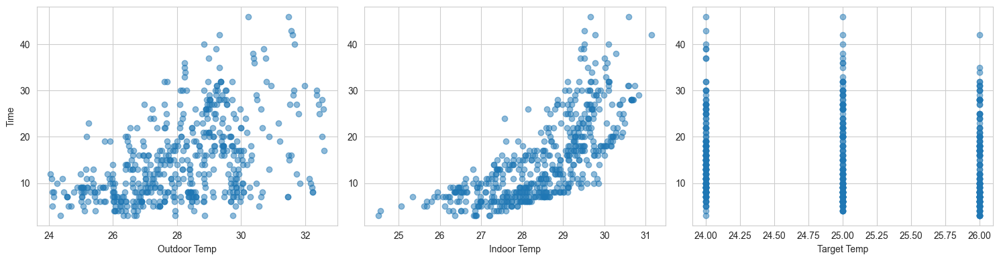

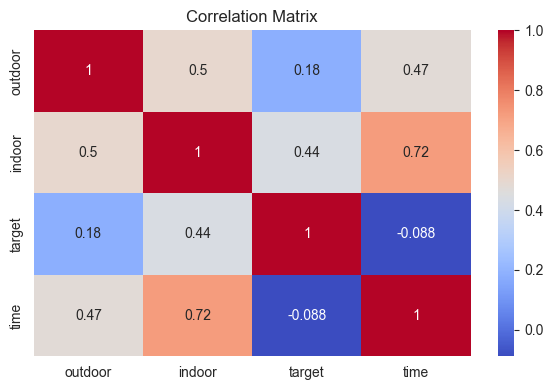

清洗后的数据已保存至: C:\Users\TR\Desktop\Postgraduate\Paper\EAB\shuju\shuju_cleaned.xlsx


In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# 4. 可视化（全部使用英文标签，避免字体问题）
sns.set_style("whitegrid")

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].scatter(df['outdoor'], df['time'], alpha=0.5)
axes[0].set_xlabel('Outdoor Temp')
axes[0].set_ylabel('Time')
axes[1].scatter(df['indoor'], df['time'], alpha=0.5)
axes[1].set_xlabel('Indoor Temp')
axes[2].scatter(df['target'], df['time'], alpha=0.5)
axes[2].set_xlabel('Target Temp')
plt.tight_layout()
plt.show()

# 相关性热力图
plt.figure(figsize=(6, 4))
sns.heatmap(df[['outdoor', 'indoor', 'target', 'time']].corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.tight_layout()
plt.show()

# 5. 保存清洗后的数据（可选）
output_path = r"C:\Users\TR\Desktop\Postgraduate\Paper\EAB\shuju\shuju_cleaned.xlsx"
df.to_excel(output_path, index=False)
print(f"清洗后的数据已保存至: {output_path}")

In [9]:
# 温差 = 目标温度 - 室内温度
# 正数表示需要加热，负数表示需要制冷
df['temp_diff'] = df['target'] - df['indoor']

# 查看温差的范围
print("温差范围:", df['temp_diff'].min(), "~", df['temp_diff'].max())

温差范围: -6.199999999999999 ~ -0.33999999999999986


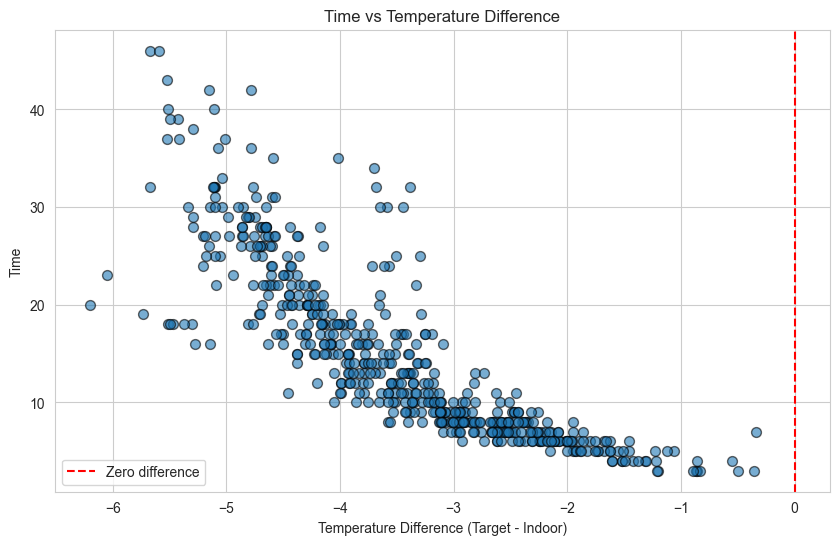

In [10]:
plt.figure(figsize=(10, 6))
plt.scatter(df['temp_diff'], df['time'], alpha=0.6, edgecolors='k', s=50)
plt.xlabel('Temperature Difference (Target - Indoor)')
plt.ylabel('Time')
plt.title('Time vs Temperature Difference')
plt.grid(True)
plt.axvline(x=0, color='red', linestyle='--', label='Zero difference')
plt.legend()
plt.show()

Original Data Size: 529
Cleaned Data Size: 529
After cooling-only filter: 529 samples
Train: 370 (69.9%)
Validation: 106 (20.0%)
Test: 53 (10.0%)

数据集已保存为: train_data.csv, val_data.csv, test_data.csv
Training until validation scores don't improve for 200 rounds
[200]	Train's rmse: 0.175171	Validation's rmse: 0.162581
[400]	Train's rmse: 0.126285	Validation's rmse: 0.158973
Early stopping, best iteration is:
[280]	Train's rmse: 0.147083	Validation's rmse: 0.155439

Final Test Set Performance
MAE  = 0.7955
RMSE = 0.9920
R²   = 0.9751


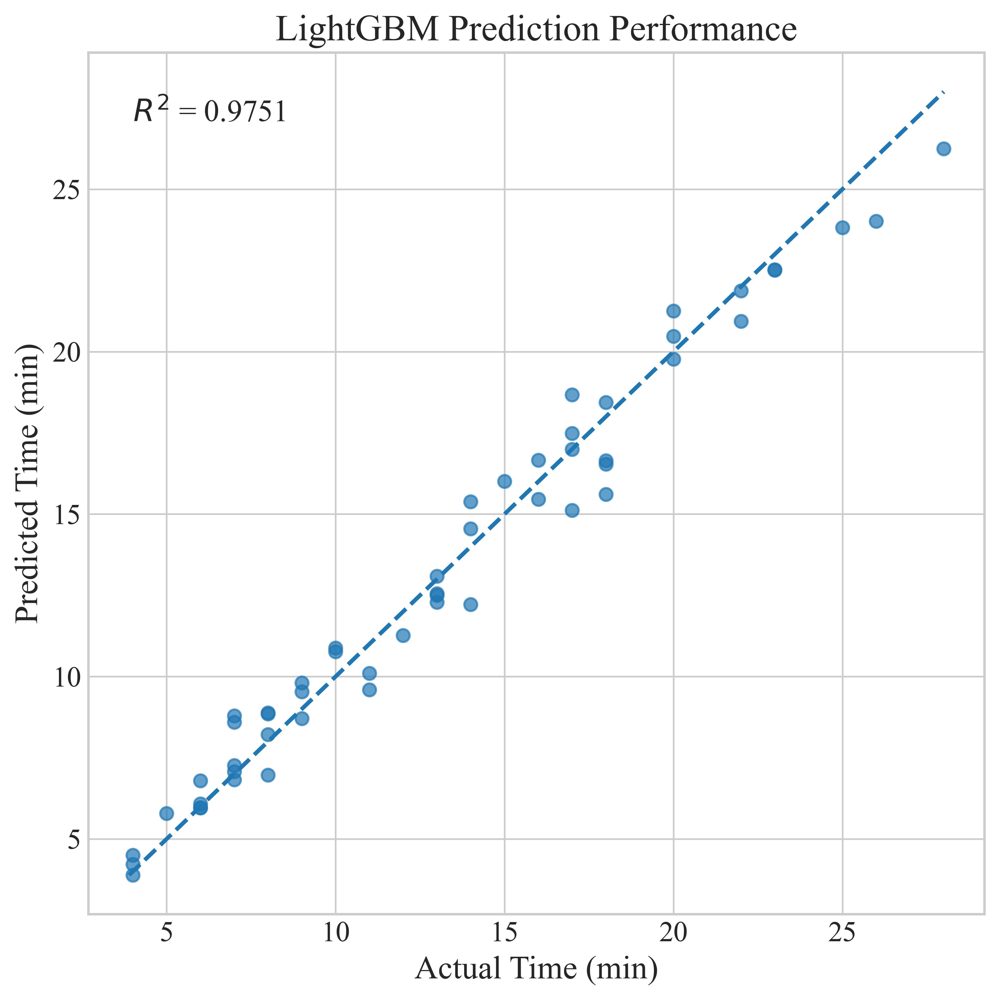

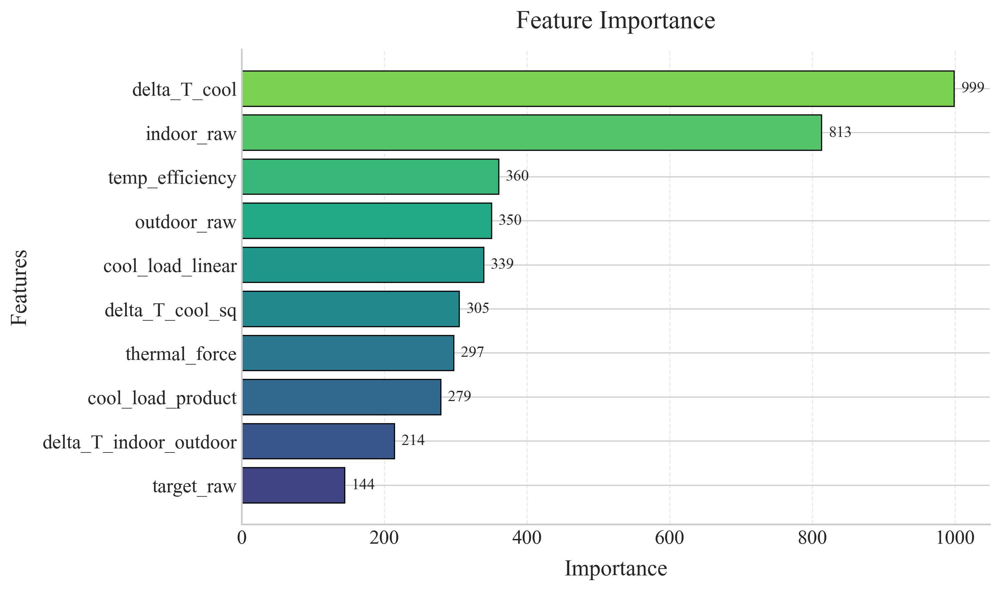


Feature Importance (Split) in descending order:
               Feature  Importance
          delta_T_cool         999
            indoor_raw         813
       temp_efficiency         360
           outdoor_raw         350
      cool_load_linear         339
       delta_T_cool_sq         305
         thermal_force         297
     cool_load_product         279
delta_T_indoor_outdoor         214
            target_raw         144

Model saved as 'lightgbm_model_cooling.txt'


In [11]:
import pandas as pd
import numpy as np
import lightgbm as lgb
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# =====================================================
# SCI Plot Style
# =====================================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 14
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# =====================================================
# 1. Load Data
# =====================================================
file_path = r"C:\Users\TR\Desktop\Postgraduate\Paper\EAB\shuju\shuju.xlsx"
df = pd.read_excel(file_path)
print("Original Data Size:", len(df))

# =====================================================
# 2. Data Cleaning (No IQR outlier removal - removed to avoid leakage)
# =====================================================
df = df.dropna()
df = df[df['time'] > 0]          # Only remove physically impossible values
print("Cleaned Data Size:", len(df))

# =====================================================
# 3. Feature Engineering for Cooling-Only Mode (Extended)
# =====================================================
# 确保制冷模式 (indoor > target)
df = df[df['indoor'] > df['target']].copy()
print(f"After cooling-only filter: {len(df)} samples")

# 基础温差
df['delta_T_cool'] = df['indoor'] - df['target']
df['delta_T_indoor_outdoor'] = df['indoor'] - df['outdoor']
df['delta_T_outdoor_target'] = df['outdoor'] - df['target']

# 非线性项
df['delta_T_cool_sq'] = df['delta_T_cool'] ** 2

# 室外更热惩罚因子
out_hotter = (df['outdoor'] - df['indoor']).clip(lower=0)
df['cool_load_linear'] = df['delta_T_cool'] * (1 + out_hotter / (df['delta_T_cool'] + 1))
df['cool_load_product'] = df['delta_T_cool'] * np.abs(df['delta_T_indoor_outdoor'])

# 比值特征
df['temp_efficiency'] = df['delta_T_cool'] / (np.abs(df['delta_T_indoor_outdoor']) + 1)

# 组合特征
df['thermal_force'] = df['delta_T_cool'] * df['delta_T_outdoor_target']

# 原始绝对温度
df['outdoor_raw'] = df['outdoor']
df['indoor_raw'] = df['indoor']
df['target_raw'] = df['target']

# 最终特征列表
feature_cols = [
    'delta_T_cool',
    'delta_T_indoor_outdoor',
    'delta_T_cool_sq',
    'cool_load_linear',
    'cool_load_product',
    'temp_efficiency',
    'thermal_force',
    'outdoor_raw',
    'indoor_raw',
    'target_raw'
]

X = df[feature_cols]
y = np.log1p(df['time'])

# =====================================================
# 4. Train / Validation / Test Split (70% / 20% / 10%)
# =====================================================
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.3, random_state=42, shuffle=True
)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=1/3, random_state=42, shuffle=True
)

print(f"Train: {len(X_train)} ({len(X_train)/len(df):.1%})")
print(f"Validation: {len(X_val)} ({len(X_val)/len(df):.1%})")
print(f"Test: {len(X_test)} ({len(X_test)/len(df):.1%})")
train_data_save = X_train.copy()
train_data_save['time'] = np.expm1(y_train)
val_data_save = X_val.copy()
val_data_save['time'] = np.expm1(y_val)
test_data_save = X_test.copy()
test_data_save['time'] = np.expm1(y_test)

train_data_save.to_csv('train_data.csv', index=False)
val_data_save.to_csv('val_data.csv', index=False)
test_data_save.to_csv('test_data.csv', index=False)
print("\n数据集已保存为: train_data.csv, val_data.csv, test_data.csv")

# =====================================================
# 5. LightGBM Datasets
# =====================================================
train_data = lgb.Dataset(X_train, label=y_train)
val_data = lgb.Dataset(X_val, label=y_val)

# =====================================================
# 6. LightGBM Parameters
# =====================================================
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'learning_rate': 0.01,
    'num_leaves': 31,
    'max_depth': 6,
    'min_data_in_leaf': 10,
    'feature_fraction': 0.7,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'lambda_l1': 0.2,
    'lambda_l2': 0.5,
    'seed': 42,
    'verbosity': -1
}

# =====================================================
# 7. Model Training (Early Stopping)
# =====================================================
model = lgb.train(
    params,
    train_data,
    num_boost_round=1000,
    valid_sets=[train_data, val_data],
    valid_names=['Train', 'Validation'],
    callbacks=[
        lgb.early_stopping(stopping_rounds=200),
        lgb.log_evaluation(period=200)
    ]
)

# =====================================================
# 8. Final Evaluation on Test Set
# =====================================================
y_pred_log = model.predict(X_test)
y_pred = np.expm1(y_pred_log)
y_test_real = np.expm1(y_test)

mae = mean_absolute_error(y_test_real, y_pred)
rmse = np.sqrt(mean_squared_error(y_test_real, y_pred))
r2 = r2_score(y_test_real, y_pred)

print("\n==============================")
print("Final Test Set Performance")
print("==============================")
print(f"MAE  = {mae:.4f}")
print(f"RMSE = {rmse:.4f}")
print(f"R²   = {r2:.4f}")

# =====================================================
# 9. Prediction Scatter Plot
# =====================================================
fig, ax = plt.subplots(figsize=(7,7), dpi=600)
ax.scatter(y_test_real, y_pred, s=40, alpha=0.7)
min_val = min(y_test_real.min(), y_pred.min())
max_val = max(y_test_real.max(), y_pred.max())
ax.plot([min_val, max_val], [min_val, max_val], linestyle='--', linewidth=2)
ax.set_xlabel('Actual Time (min)', fontsize=16)
ax.set_ylabel('Predicted Time (min)', fontsize=16)
ax.set_title('LightGBM Prediction Performance', fontsize=18)
ax.text(0.05, 0.92, f'$R^2$ = {r2:.4f}', transform=ax.transAxes, fontsize=15)
plt.tight_layout()
plt.savefig('Prediction_Performance_Extended.png', dpi=600, bbox_inches='tight')
plt.show()

# =====================================================
# 10. Feature Importance (using the trained model directly)
# =====================================================
importance = model.feature_importance(importance_type='split')
feature_importance = pd.DataFrame({'Feature': feature_cols, 'Importance': importance})
feature_importance = feature_importance.sort_values('Importance', ascending=True)

fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
colors = plt.cm.viridis(np.linspace(0.2, 0.8, len(feature_importance)))
bars = ax.barh(feature_importance['Feature'], feature_importance['Importance'],
               color=colors, edgecolor='black', linewidth=0.8)

max_imp = feature_importance['Importance'].max()
for bar, val in zip(bars, feature_importance['Importance']):
    ax.text(bar.get_width() + max_imp * 0.01,
            bar.get_y() + bar.get_height()/2,
            f'{int(val)}', va='center', ha='left', fontsize=11)

ax.set_xlabel('Importance', fontsize=16, labelpad=8)
ax.set_ylabel('Features', fontsize=16, labelpad=8)
ax.set_title('Feature Importance', fontsize=18, pad=15)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.grid(True, linestyle='--', alpha=0.4)
ax.set_axisbelow(True)
plt.tight_layout()
plt.savefig('Feature_Importance_Extended.png', dpi=600, bbox_inches='tight')
plt.show()

print("\nFeature Importance (Split) in descending order:")
print(feature_importance.sort_values('Importance', ascending=False).to_string(index=False))

# =====================================================
# 11. Save Model
# =====================================================
model.save_model('lightgbm_model_cooling.txt')
print("\nModel saved as 'lightgbm_model_cooling.txt'")

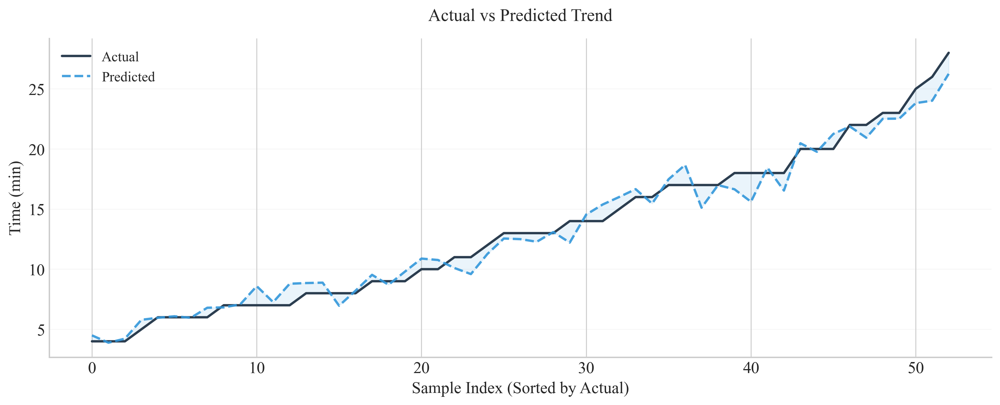

In [12]:
import numpy as np
import matplotlib.pyplot as plt

order = np.argsort(y_test_real)
y_test_sorted = np.array(y_test_real)[order]
y_pred_sorted = np.array(y_pred)[order]
x_axis = np.arange(len(y_test_sorted))

fig, ax = plt.subplots(figsize=(12, 5), dpi=300)

# 实际值：深灰色细实线
ax.plot(x_axis, y_test_sorted, label='Actual', 
        color='#2c3e50', linestyle='-', linewidth=2.0)

# 预测值：亮蓝色细虚线，加非常淡的填充丝带
ax.plot(x_axis, y_pred_sorted, label='Predicted', 
        color='#3498db', linestyle='--', linewidth=2.0, alpha=0.9)

# 关键美化：在两条线之间填充极淡的渐变蓝色，覆盖整个区间
ax.fill_between(x_axis, y_test_sorted, y_pred_sorted, 
                color='#3498db', alpha=0.1, interpolate=True)

# 极简网格
ax.grid(True, axis='y', linestyle='-', alpha=0.15)
ax.set_xlabel('Sample Index (Sorted by Actual)', fontsize=14)
ax.set_ylabel('Time (min)', fontsize=14)
ax.set_title('Actual vs Predicted Trend', fontsize=15, pad=15)

# 去掉顶部和右侧边框
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(frameon=False, fontsize=12)
plt.tight_layout()
plt.savefig('Actual_vs_Predicted_Line.png', dpi=600, bbox_inches='tight')
plt.show()

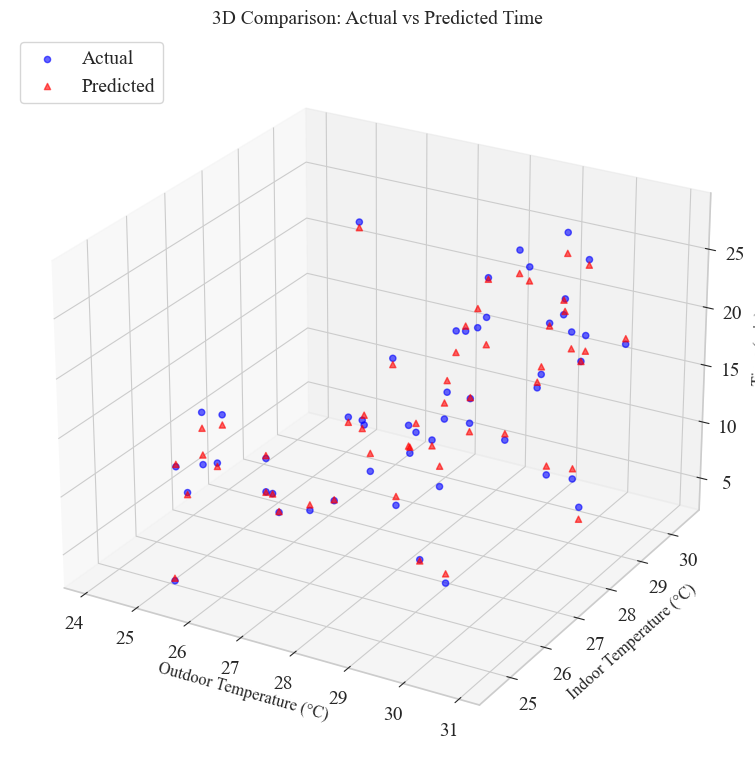

In [18]:
# =====================================================
# 10. 三维散点图：实际值与预测值 vs (室外温度, 室内温度)
# =====================================================
from mpl_toolkits.mplot3d import Axes3D

# 提取测试集特征
outdoor = X_test['outdoor_raw'].values
indoor = X_test['indoor_raw'].values
actual = y_test_real.values
pred = y_pred

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# 实际值（蓝色）
sc1 = ax.scatter(outdoor, indoor, actual, 
                 c='blue', marker='o', s=20, alpha=0.6, label='Actual')
# 预测值（红色）
sc2 = ax.scatter(outdoor, indoor, pred, 
                 c='red', marker='^', s=20, alpha=0.6, label='Predicted')

ax.set_xlabel('Outdoor Temperature (°C)', fontsize=12)
ax.set_ylabel('Indoor Temperature (°C)', fontsize=12)
ax.set_zlabel('Time (min)', fontsize=12)
ax.set_title('3D Comparison: Actual vs Predicted Time', fontsize=14)

# 图例
ax.legend(loc='upper left')

# 调整视角
ax.view_init(elev=25, azim=-60)

plt.tight_layout()
plt.savefig('3D_Prediction_vs_Actual.png', dpi=300, bbox_inches='tight')
plt.show()

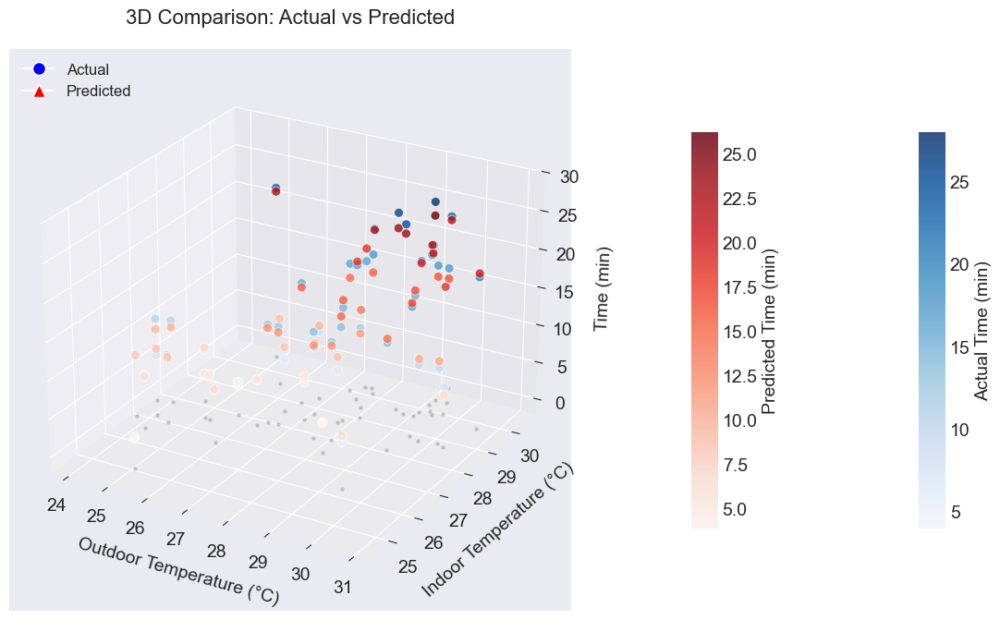

In [24]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# 设置美观样式
plt.style.use('seaborn-v0_8-darkgrid')

# 提取数据
outdoor = X_test['outdoor_raw'].values
indoor = X_test['indoor_raw'].values
actual = y_test_real.values
pred = y_pred

fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# 实际值（蓝色渐变，按实际值大小着色）
sc1 = ax.scatter(outdoor, indoor, actual, 
                 c=actual, cmap='Blues', s=50, alpha=0.8, 
                 edgecolors='w', linewidth=0.5, label='Actual')

# 预测值（红色渐变，按预测值大小着色）
sc2 = ax.scatter(outdoor, indoor, pred, 
                 c=pred, cmap='Reds', s=50, alpha=0.8, 
                 edgecolors='w', linewidth=0.5, label='Predicted')

# 添加投影线（在z=0平面画小点）
ax.scatter(outdoor, indoor, np.zeros_like(actual), 
           c='gray', s=5, alpha=0.3, depthshade=False)

ax.set_xlabel('Outdoor Temperature (°C)', fontsize=14, labelpad=10)
ax.set_ylabel('Indoor Temperature (°C)', fontsize=14, labelpad=10)
ax.set_zlabel('Time (min)', fontsize=14, labelpad=10)
ax.set_title('3D Comparison: Actual vs Predicted', fontsize=16, pad=20)

# 图例（手动创建图例）
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker='o', color='w', label='Actual',
                          markerfacecolor='blue', markersize=10),
                   Line2D([0], [0], marker='^', color='w', label='Predicted',
                          markerfacecolor='red', markersize=10)]
ax.legend(handles=legend_elements, loc='upper left', fontsize=12)

# 视角调整
ax.view_init(elev=25, azim=-60)

# 颜色条
cbar1 = fig.colorbar(sc1, ax=ax, shrink=0.5, aspect=15, pad=0.1)
cbar1.set_label('Actual Time (min)')
cbar2 = fig.colorbar(sc2, ax=ax, shrink=0.5, aspect=15, pad=0.15)
cbar2.set_label('Predicted Time (min)')

plt.tight_layout()
plt.savefig('3D_Prediction_Beautiful.png', dpi=300, bbox_inches='tight')
plt.show()

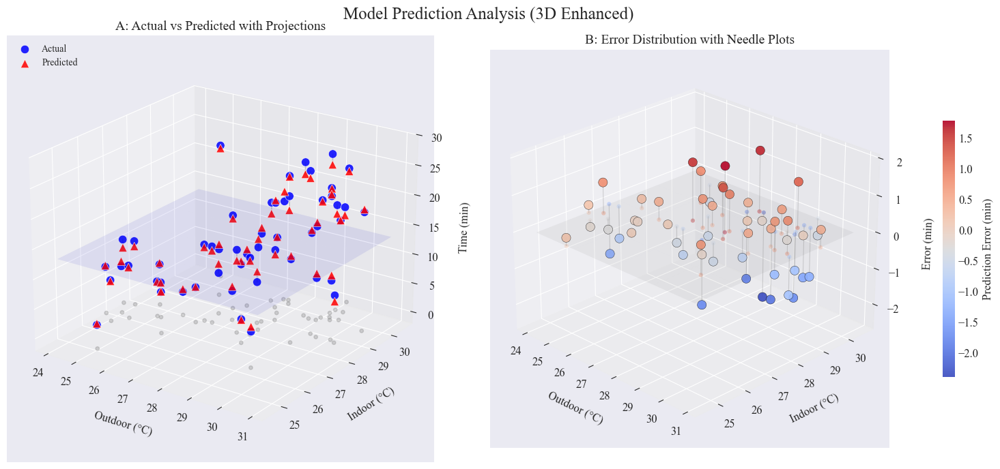

In [29]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# 提取数据
outdoor = X_test['outdoor_raw'].values
indoor = X_test['indoor_raw'].values
actual = y_test_real.values
pred = y_pred
error = pred - actual

# 设置风格
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 12

# 创建 1行2列 子图（更大，更清晰）
fig = plt.figure(figsize=(16, 7))
fig.suptitle('Model Prediction Analysis (3D Enhanced)', fontsize=18, y=0.98)

# ==========================================
# 子图 A: 对比散点 + 底部投影 + 连线
# ==========================================
ax1 = fig.add_subplot(1, 2, 1, projection='3d')

# 1. 底部投影（灰色小点，填充底部空间）
ax1.scatter(outdoor, indoor, zs=0, zdir='z', 
            c='gray', s=15, alpha=0.3, label='_nolegend_')

# 2. 实际值（蓝色大圆点）
ax1.scatter(outdoor, indoor, actual, 
            c='blue', s=80, alpha=0.85, label='Actual', 
            edgecolors='white', linewidth=0.5)

# 3. 预测值（红色大三角）
ax1.scatter(outdoor, indoor, pred, 
            c='red', s=80, alpha=0.85, label='Predicted', 
            marker='^', edgecolors='white', linewidth=0.5)

# 4. 连线（从实际到预测，半透明灰色，略粗）
for i in range(len(outdoor)):
    ax1.plot([outdoor[i], outdoor[i]], 
             [indoor[i], indoor[i]], 
             [actual[i], pred[i]], 
             color='gray', linestyle='-', linewidth=1.2, alpha=0.4)

# 5. 添加半透明水平参考面（z=实际值均值）
mean_actual = np.mean(actual)
xx, yy = np.meshgrid(np.linspace(outdoor.min(), outdoor.max(), 5),
                     np.linspace(indoor.min(), indoor.max(), 5))
zz = np.full_like(xx, mean_actual)
ax1.plot_surface(xx, yy, zz, alpha=0.08, color='blue', edgecolor='none')

# 坐标轴与标题
ax1.set_xlabel('Outdoor (°C)', labelpad=10)
ax1.set_ylabel('Indoor (°C)', labelpad=10)
ax1.set_zlabel('Time (min)', labelpad=10)
ax1.set_title('A: Actual vs Predicted with Projections', fontsize=14)
ax1.legend(loc='upper left', fontsize=10)
ax1.view_init(elev=22, azim=-55)

# ==========================================
# 子图 B: 误差针状图 + 底部投影 + 颜色映射
# ==========================================
ax2 = fig.add_subplot(1, 2, 2, projection='3d')

# 1. 底部投影（按误差颜色）
proj = ax2.scatter(outdoor, indoor, zs=0, zdir='z', 
                   c=error, cmap='coolwarm', s=20, alpha=0.4, edgecolors='none')

# 2. 误差点（大散点，颜色映射）
sc = ax2.scatter(outdoor, indoor, error, 
                 c=error, cmap='coolwarm', s=90, alpha=0.9, 
                 edgecolors='black', linewidth=0.3)

# 3. 针状线（从 z=0 到误差点）
for i in range(len(outdoor)):
    ax2.plot([outdoor[i], outdoor[i]], 
             [indoor[i], indoor[i]], 
             [0, error[i]], 
             color='gray', linewidth=0.8, alpha=0.3)

# 4. 添加零平面（半透明网格）
xx, yy = np.meshgrid(np.linspace(outdoor.min(), outdoor.max(), 5),
                     np.linspace(indoor.min(), indoor.max(), 5))
zz_zero = np.full_like(xx, 0)
ax2.plot_surface(xx, yy, zz_zero, alpha=0.08, color='gray', edgecolor='none')

# 坐标轴与标题
ax2.set_xlabel('Outdoor (°C)', labelpad=10)
ax2.set_ylabel('Indoor (°C)', labelpad=10)
ax2.set_zlabel('Error (min)', labelpad=10)
ax2.set_title('B: Error Distribution with Needle Plots', fontsize=14)
ax2.view_init(elev=25, azim=-45)

# 颜色条
cbar = fig.colorbar(sc, ax=ax2, shrink=0.6, aspect=20, pad=0.1)
cbar.set_label('Prediction Error (min)')

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.savefig('Two_3D_Enhanced_Subplots.png', dpi=300, bbox_inches='tight')
plt.show()

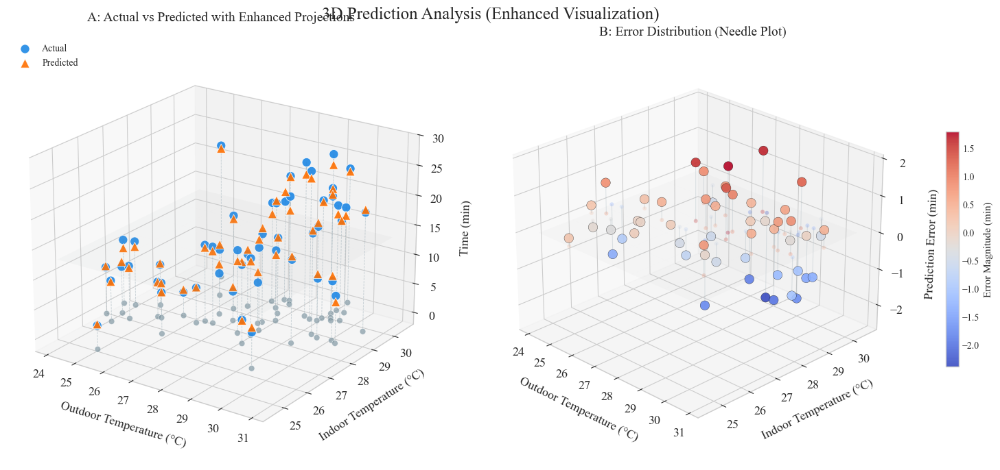

In [35]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# 提取数据
outdoor = X_test['outdoor_raw'].values
indoor = X_test['indoor_raw'].values
actual = y_test_real.values
pred = y_pred
error = pred - actual

# ========================
# 设置全局风格与字体
# ========================
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 13
plt.rcParams['axes.linewidth'] = 1.0

# 调色板定义（科研专业配色）
color_actual = '#1E88E5'      # 明亮的靛蓝色（实际值）
color_pred = '#FF6F00'        # 琥珀橙（预测值）
color_line = '#90A4AE'        # 蓝灰色（连线/辅助线）
color_proj = '#CFD8DC'        # 浅灰色（投影点）
color_plane = '#ECEFF1'       # 极浅灰（参考平面）

fig = plt.figure(figsize=(16, 7))
fig.suptitle('3D Prediction Analysis (Enhanced Visualization)', fontsize=18, y=0.98)

# ==========================================
# 图 A: 对比散点 + 超清晰底部投影 + 引导线
# ==========================================
ax1 = fig.add_subplot(1, 2, 1, projection='3d')

# ---------- 1. 底部投影（显眼优化） ----------
# 核心改动：尺寸翻倍、颜色加深、透明度降低、增加白色边缘
ax1.scatter(outdoor, indoor, zs=0, zdir='z',
            c='#78909C',            # 深蓝灰色，比浅灰更清晰
            s=40,                   # 尺寸加大（原12 -> 40）
            alpha=0.65,             # 不透明度提高（原0.35 -> 0.65）
            edgecolors='white',     # 加白边，增强单点辨识度
            linewidth=0.5,
            label='_nolegend_')

# ---------- 2. 投影引导线（从底部竖直连接到数据点） ----------
# 这条线能极大强化“投影”的感觉，让点与投影的对应关系一目了然
for i in range(len(outdoor)):
    # 实际值的引导线（连接底部 -> 实际值）
    ax1.plot([outdoor[i], outdoor[i]],
             [indoor[i], indoor[i]],
             [0, actual[i]],
             color='#B0BEC5', linestyle='--', linewidth=0.6, alpha=0.4)
    # 预测值的引导线（连接底部 -> 预测值）
    ax1.plot([outdoor[i], outdoor[i]],
             [indoor[i], indoor[i]],
             [0, pred[i]],
             color='#B0BEC5', linestyle='--', linewidth=0.6, alpha=0.4)

# ---------- 3. 实际值与预测值（主数据点） ----------
# 实际值（保持原有配色，尺寸略增）
ax1.scatter(outdoor, indoor, actual,
            c='#1E88E5', s=90, alpha=0.9, label='Actual',
            edgecolors='white', linewidth=0.6)

# 预测值
ax1.scatter(outdoor, indoor, pred,
            c='#FF6F00', s=90, alpha=0.9, label='Predicted',
            marker='^', edgecolors='white', linewidth=0.6)

# ---------- 4. 连线（实际值 -> 预测值，保持不变） ----------
for i in range(len(outdoor)):
    ax1.plot([outdoor[i], outdoor[i]],
             [indoor[i], indoor[i]],
             [actual[i], pred[i]],
             color='#90A4AE', linestyle='-', linewidth=1.2, alpha=0.5)

# ---------- 5. 半透明参考平面（略调透明度） ----------
mean_actual = np.mean(actual)
xx, yy = np.meshgrid(np.linspace(outdoor.min(), outdoor.max(), 6),
                     np.linspace(indoor.min(), indoor.max(), 6))
zz = np.full_like(xx, mean_actual)
ax1.plot_surface(xx, yy, zz, alpha=0.06, color='#CFD8DC', edgecolor='none')

# 坐标轴与标题
ax1.set_xlabel('Outdoor Temperature (°C)', labelpad=10)
ax1.set_ylabel('Indoor Temperature (°C)', labelpad=10)
ax1.set_zlabel('Time (min)', labelpad=10)
ax1.set_title('A: Actual vs Predicted with Enhanced Projections', fontsize=14, pad=15)
ax1.legend(loc='upper left', fontsize=10, framealpha=0.9)
ax1.view_init(elev=22, azim=-55)

# ==========================================
# 图 B: 误差针状图 + 底部投影（配色联动优化）
# ==========================================
ax2 = fig.add_subplot(1, 2, 2, projection='3d')

# 1. 底部投影（按误差颜色映射，淡化处理）
proj = ax2.scatter(outdoor, indoor, zs=0, zdir='z',
                   c=error, cmap='coolwarm', s=18, alpha=0.3, edgecolors='none')

# 2. 误差点（大散点，颜色映射 + 黑色细边）
sc = ax2.scatter(outdoor, indoor, error,
                 c=error, cmap='coolwarm', s=95, alpha=0.9,
                 edgecolors='black', linewidth=0.25)

# 3. 针状线（从 z=0 到误差点，浅灰）
for i in range(len(outdoor)):
    ax2.plot([outdoor[i], outdoor[i]],
             [indoor[i], indoor[i]],
             [0, error[i]],
             color=color_line, linewidth=0.8, alpha=0.25)

# 4. 零平面（半透明网格）
xx_zero, yy_zero = np.meshgrid(np.linspace(outdoor.min(), outdoor.max(), 6),
                               np.linspace(indoor.min(), indoor.max(), 6))
zz_zero = np.full_like(xx_zero, 0)
ax2.plot_surface(xx_zero, yy_zero, zz_zero, alpha=0.06, color=color_plane, edgecolor='none')

# 坐标轴与标题
ax2.set_xlabel('Outdoor Temperature (°C)', labelpad=10)
ax2.set_ylabel('Indoor Temperature (°C)', labelpad=10)
ax2.set_zlabel('Prediction Error (min)', labelpad=10)
ax2.set_title('B: Error Distribution (Needle Plot)', fontsize=14, pad=15)
ax2.view_init(elev=25, azim=-45)

# 颜色条（完善标注）
cbar = fig.colorbar(sc, ax=ax2, shrink=0.55, aspect=18, pad=0.1)
cbar.set_label('Error Magnitude (min)', fontsize=11)
cbar.ax.tick_params(labelsize=10)

# ========================
# 输出与保存
# ========================
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.savefig('Two_3D_Enhanced_Subplots.png', dpi=300, bbox_inches='tight')
plt.show()

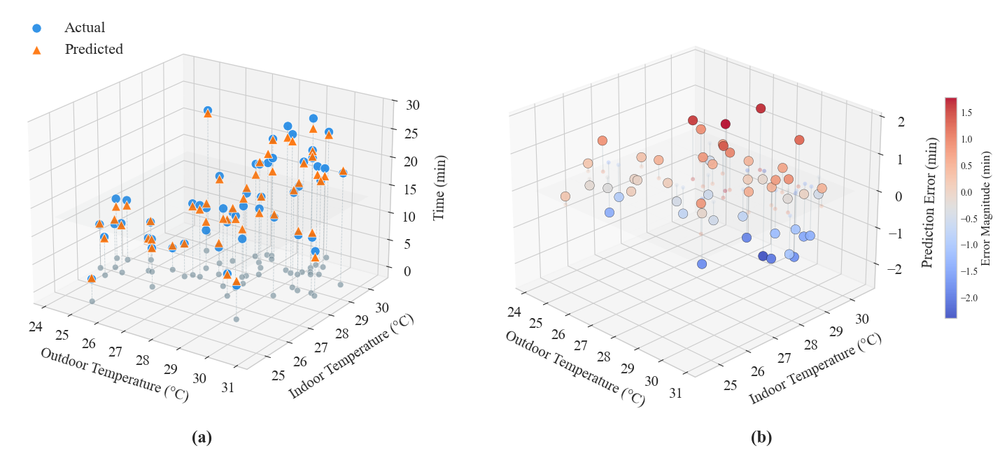

In [42]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# 提取数据
outdoor = X_test['outdoor_raw'].values
indoor = X_test['indoor_raw'].values
actual = y_test_real.values
pred = y_pred
error = pred - actual

# ========================
# 设置全局风格与字体
# ========================
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 15
plt.rcParams['axes.linewidth'] = 1.0

# 调色板定义（科研专业配色）
color_actual = '#1E88E5'      # 明亮的靛蓝色（实际值）
color_pred = '#FF6F00'        # 琥珀橙（预测值）
color_line = '#90A4AE'        # 蓝灰色（连线/辅助线）
color_proj = '#CFD8DC'        # 浅灰色（投影点）
color_plane = '#ECEFF1'       # 极浅灰（参考平面）

fig = plt.figure(figsize=(16, 7))
# 不再使用 suptitle

# ==========================================
# 图 (a): 对比散点 + 超清晰底部投影 + 引导线
# ==========================================
ax1 = fig.add_subplot(1, 2, 1, projection='3d')

# ---------- 1. 底部投影（显眼优化） ----------
ax1.scatter(outdoor, indoor, zs=0, zdir='z',
            c='#78909C',            # 深蓝灰色，比浅灰更清晰
            s=40,                   # 尺寸加大（原12 -> 40）
            alpha=0.65,             # 不透明度提高（原0.35 -> 0.65）
            edgecolors='white',     # 加白边，增强单点辨识度
            linewidth=0.5,
            label='_nolegend_')

# ---------- 2. 投影引导线（从底部竖直连接到数据点） ----------
for i in range(len(outdoor)):
    # 实际值的引导线（连接底部 -> 实际值）
    ax1.plot([outdoor[i], outdoor[i]],
             [indoor[i], indoor[i]],
             [0, actual[i]],
             color='#B0BEC5', linestyle='--', linewidth=0.6, alpha=0.4)
    # 预测值的引导线（连接底部 -> 预测值）
    ax1.plot([outdoor[i], outdoor[i]],
             [indoor[i], indoor[i]],
             [0, pred[i]],
             color='#B0BEC5', linestyle='--', linewidth=0.6, alpha=0.4)

# ---------- 3. 实际值与预测值（主数据点） ----------
ax1.scatter(outdoor, indoor, actual,
            c='#1E88E5', s=90, alpha=0.9, label='Actual',
            edgecolors='white', linewidth=0.6)

ax1.scatter(outdoor, indoor, pred,
            c='#FF6F00', s=90, alpha=0.9, label='Predicted',
            marker='^', edgecolors='white', linewidth=0.6)

# ---------- 4. 连线（实际值 -> 预测值） ----------
for i in range(len(outdoor)):
    ax1.plot([outdoor[i], outdoor[i]],
             [indoor[i], indoor[i]],
             [actual[i], pred[i]],
             color='#90A4AE', linestyle='-', linewidth=1.2, alpha=0.5)

# ---------- 5. 半透明参考平面 ----------
mean_actual = np.mean(actual)
xx, yy = np.meshgrid(np.linspace(outdoor.min(), outdoor.max(), 6),
                     np.linspace(indoor.min(), indoor.max(), 6))
zz = np.full_like(xx, mean_actual)
ax1.plot_surface(xx, yy, zz, alpha=0.06, color='#CFD8DC', edgecolor='none')

# 坐标轴标签
ax1.set_xlabel('Outdoor Temperature (°C)', labelpad=10)
ax1.set_ylabel('Indoor Temperature (°C)', labelpad=10)
ax1.set_zlabel('Time (min)', labelpad=10)
# 移除标题
ax1.legend(loc='upper left', fontsize=16, framealpha=0.9)   # 图例字体调大
ax1.view_init(elev=22, azim=-55)

# ==========================================
# 图 (b): 误差针状图 + 底部投影
# ==========================================
ax2 = fig.add_subplot(1, 2, 2, projection='3d')

# 1. 底部投影（按误差颜色映射）
proj = ax2.scatter(outdoor, indoor, zs=0, zdir='z',
                   c=error, cmap='coolwarm', s=18, alpha=0.3, edgecolors='none')

# 2. 误差点（颜色映射）
sc = ax2.scatter(outdoor, indoor, error,
                 c=error, cmap='coolwarm', s=95, alpha=0.9,
                 edgecolors='black', linewidth=0.25)

# 3. 针状线
for i in range(len(outdoor)):
    ax2.plot([outdoor[i], outdoor[i]],
             [indoor[i], indoor[i]],
             [0, error[i]],
             color=color_line, linewidth=0.8, alpha=0.25)

# 4. 零平面
xx_zero, yy_zero = np.meshgrid(np.linspace(outdoor.min(), outdoor.max(), 6),
                               np.linspace(indoor.min(), indoor.max(), 6))
zz_zero = np.full_like(xx_zero, 0)
ax2.plot_surface(xx_zero, yy_zero, zz_zero, alpha=0.06, color=color_plane, edgecolor='none')

ax2.set_xlabel('Outdoor Temperature (°C)', labelpad=10)
ax2.set_ylabel('Indoor Temperature (°C)', labelpad=10)
ax2.set_zlabel('Prediction Error (min)', labelpad=10)
# 移除标题
ax2.view_init(elev=25, azim=-45)

# 颜色条
cbar = fig.colorbar(sc, ax=ax2, shrink=0.55, aspect=18, pad=0.1)
cbar.set_label('Error Magnitude (min)', fontsize=13)
cbar.ax.tick_params(labelsize=10)

# ========================
# 布局调整：为底部文字留空间
# ========================
plt.tight_layout()
plt.subplots_adjust(top=0.92, bottom=0.1)   # 底部留空

# 在子图下方添加 (a) 和 (b)
fig.text(0.25, 0.03, '(a)', ha='center', fontsize=18, fontweight='bold')
fig.text(0.75, 0.03, '(b)', ha='center', fontsize=18, fontweight='bold')

plt.savefig('Two_3D_Enhanced_Subplots.png', dpi=300, bbox_inches='tight')
plt.show()

成功读取 10 个典型样本
   outdoor_raw  indoor_raw  target_raw
0        28.10       28.09          25
1        28.15       28.22          24
2        24.08       27.18          24
3        25.44       24.55          24
4        28.41       28.49          25
基于10个样本：±1°C 数据点 20 个, ±2°C 数据点 20 个


C:\Users\TR\AppData\Local\Temp\ipykernel_18280\3829981727.py:125: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax2.boxplot([dev_1, dev_2],


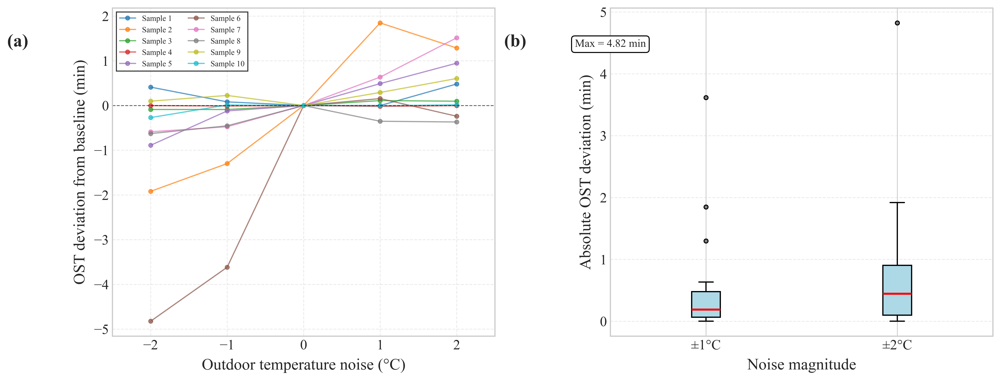


========== 基于选定的10个样本的敏感性统计 ==========
±1°C 噪声下平均绝对偏差: 0.5145 分钟
±2°C 噪声下平均绝对偏差: 0.7636 分钟
所有噪声下的最大绝对偏差: 4.8234 分钟

✅ 论文段落可参考（注意说明基于典型样本）：
'对选定的10个典型工况样本进行敏感性分析，当室外温度输入存在 ±2°C 的测量误差时，OST预测值的最大偏差为 4.823 min，平均偏差为 0.764 min，表明本框架对传感器噪声具有良好的鲁棒性。'


In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. SCI 论文风格
# ============================================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 14
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

# ============================================================
# 2. 特征重计算函数（与训练时完全一致）
# ============================================================
def compute_full_features(outdoor, indoor, target):
    delta_T_cool = indoor - target
    delta_T_indoor_outdoor = indoor - outdoor
    delta_T_outdoor_target = outdoor - target
    delta_T_cool_sq = delta_T_cool ** 2
    out_hotter = max(0, outdoor - indoor)
    cool_load_linear = delta_T_cool * (1 + out_hotter / (delta_T_cool + 1))
    cool_load_product = delta_T_cool * abs(delta_T_indoor_outdoor)
    temp_efficiency = delta_T_cool / (abs(delta_T_indoor_outdoor) + 1)
    thermal_force = delta_T_cool * delta_T_outdoor_target
    return np.array([
        delta_T_cool,
        delta_T_indoor_outdoor,
        delta_T_cool_sq,
        cool_load_linear,
        cool_load_product,
        temp_efficiency,
        thermal_force,
        outdoor,   # outdoor_raw
        indoor,    # indoor_raw
        target     # target_raw
    ])

# ============================================================
# 3. 读取你选好的10个样本（绝对路径）
# ============================================================
file_path = r"C:\Users\TR\Desktop\Postgraduate\Paper\EAB\ipynb\random_10_samples_with_target.csv"
selected_df = pd.read_csv(file_path)

# 列名映射（中文→英文）
selected_df = selected_df.rename(columns={
    '室内温度': 'indoor_raw',
    '室外温度': 'outdoor_raw',
    '目标室内温度': 'target_raw',
    '实际最优提前时间': 'time_true'
})

print(f"成功读取 {len(selected_df)} 个典型样本")
print(selected_df[['outdoor_raw', 'indoor_raw', 'target_raw']].head())

# ============================================================
# 4. 对10个典型样本做折线图数据（每个样本5个噪声水平）
# ============================================================
noise_levels = [-2, -1, 0, 1, 2]
line_results = {}   # 每个样本在不同噪声下的预测OST列表
base_preds = {}     # 每个样本在无噪声下的预测OST

for idx, row in selected_df.iterrows():
    base_outdoor = row['outdoor_raw']
    indoor = row['indoor_raw']
    target = row['target_raw']
    preds = []
    for noise in noise_levels:
        features = compute_full_features(base_outdoor + noise, indoor, target)
        pred_log = model.predict(features.reshape(1, -1))
        preds.append(np.expm1(pred_log)[0])
    line_results[idx] = preds
    base_preds[idx] = preds[2]   # noise=0

# ============================================================
# 5. 对同样的10个样本做箱线图数据（仅使用这10个样本）
# ============================================================
dev_1 = []   # ±1°C 的绝对偏差
dev_2 = []   # ±2°C 的绝对偏差

for idx, row in selected_df.iterrows():
    base_outdoor = row['outdoor_raw']
    indoor = row['indoor_raw']
    target = row['target_raw']
    # 无噪声基准
    features_base = compute_full_features(base_outdoor, indoor, target)
    pred_base = np.expm1(model.predict(features_base.reshape(1, -1)))[0]
    
    # ±1°C
    for noise in [-1, 1]:
        features = compute_full_features(base_outdoor + noise, indoor, target)
        pred = np.expm1(model.predict(features.reshape(1, -1)))[0]
        dev_1.append(abs(pred - pred_base))
    # ±2°C
    for noise in [-2, 2]:
        features = compute_full_features(base_outdoor + noise, indoor, target)
        pred = np.expm1(model.predict(features.reshape(1, -1)))[0]
        dev_2.append(abs(pred - pred_base))

print(f"基于10个样本：±1°C 数据点 {len(dev_1)} 个, ±2°C 数据点 {len(dev_2)} 个")

# ============================================================
# 6. 绘制双图（折线图和箱线图均基于这10个样本）
# ============================================================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5.5), dpi=600)

# ---------- 子图 (a) 折线图 ----------
for idx in line_results.keys():
    preds = line_results[idx]
    deviations = [p - base_preds[idx] for p in preds]
    ax1.plot(noise_levels, deviations, marker='o', markersize=4,
             linewidth=1.2, alpha=0.7, label=f'Sample {idx+1}')

ax1.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.6)
ax1.set_xlabel('Outdoor temperature noise (°C)', fontsize=16, labelpad=6)
ax1.set_ylabel('OST deviation from baseline (min)', fontsize=16, labelpad=6)
ax1.grid(True, linestyle='--', alpha=0.4)
ax1.legend(ncol=2, fontsize=8, frameon=True, fancybox=False, edgecolor='black')
ax1.set_xlim(-2.5, 2.5)
ax1.text(-0.22, 0.92, '(a)', transform=ax1.transAxes, fontsize=18, fontweight='bold',
         verticalalignment='top', horizontalalignment='right')

# ---------- 子图 (b) 箱线图（仅基于10个样本） ----------
bp = ax2.boxplot([dev_1, dev_2], 
                 labels=['±1°C', '±2°C'],
                 patch_artist=True,
                 boxprops=dict(facecolor='lightblue', color='black', linewidth=1.2),
                 whiskerprops=dict(color='black', linewidth=1.2),
                 capprops=dict(color='black', linewidth=1.2),
                 medianprops=dict(color='red', linewidth=2),
                 flierprops=dict(marker='o', markerfacecolor='gray', markersize=4))

ax2.set_xlabel('Noise magnitude', fontsize=16, labelpad=6)
ax2.set_ylabel('Absolute OST deviation (min)', fontsize=16, labelpad=6)
ax2.grid(True, linestyle='--', alpha=0.4, axis='y')

# 标注最大偏差（基于这10个样本）
max_dev_10 = max(dev_1 + dev_2)
ax2.text(0.5, max_dev_10 * 0.92, f'Max = {max_dev_10:.2f} min', ha='center',
         fontsize=11, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))

ax2.text(-0.22, 0.92, '(b)', transform=ax2.transAxes, fontsize=18, fontweight='bold',
         verticalalignment='top', horizontalalignment='right')

plt.tight_layout()
plt.savefig('Figure_Sensitivity_10SamplesOnly.png', dpi=600, bbox_inches='tight')
plt.show()

# ============================================================
# 7. 输出统计数字（基于这10个样本）
# ============================================================
print("\n========== 基于选定的10个样本的敏感性统计 ==========")
print(f"±1°C 噪声下平均绝对偏差: {np.mean(dev_1):.4f} 分钟")
print(f"±2°C 噪声下平均绝对偏差: {np.mean(dev_2):.4f} 分钟")
print(f"所有噪声下的最大绝对偏差: {max_dev_10:.4f} 分钟")
print("\n✅ 论文段落可参考（注意说明基于典型样本）：")
print(f"'对选定的10个典型工况样本进行敏感性分析，"
      f"当室外温度输入存在 ±2°C 的测量误差时，"
      f"OST预测值的最大偏差为 {max_dev_10:.3f} min，"
      f"平均偏差为 {np.mean(dev_2):.3f} min，"
      f"表明本框架对传感器噪声具有良好的鲁棒性。'")

成功读取 10 个典型样本，温差范围: 0.6 ~ 5.3 °C

开始执行混合迭代预测（RC + LightGBM）...
样本 1: 温差 3.1°C, 迭代 3 次
样本 2: 温差 4.2°C, 迭代 2 次
样本 3: 温差 3.2°C, 迭代 18 次
样本 4: 温差 0.6°C, 迭代 2 次
样本 5: 温差 3.5°C, 迭代 2 次
样本 6: 温差 5.3°C, 迭代 3 次
样本 7: 温差 4.3°C, 迭代 2 次
样本 8: 温差 3.3°C, 迭代 15 次
样本 9: 温差 2.2°C, 迭代 2 次
样本 10: 温差 2.2°C, 迭代 5 次


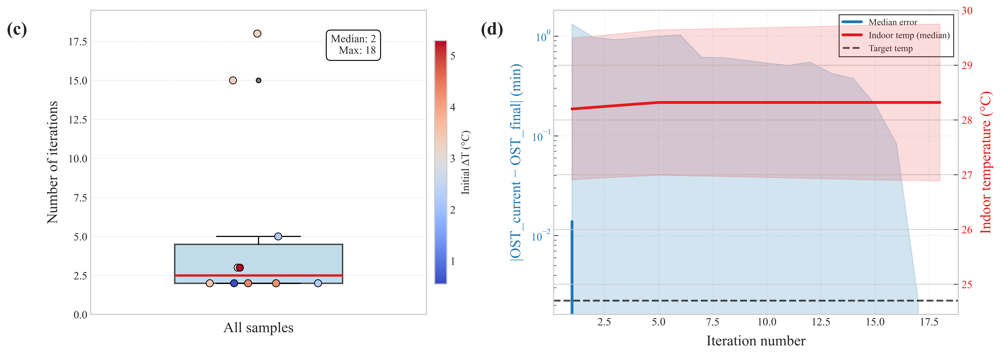


📊 收敛速度统计（基于10个典型样本）
平均迭代次数: 5.40
中位数: 2
最大迭代次数: 18
所有样本均在 18 次内收敛

✅ 你现在的论文可以这样写（升级版）：
------------------------------------------------------------
图 (c) 展示了迭代次数随初始温差的分布。彩色散点表明，即使初始温差



In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
from scipy.interpolate import interp1d

# ============================================================
# 1. SCI 论文风格（全局设置）
# ============================================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.major.size'] = 5
plt.rcParams['ytick.major.size'] = 5

# ============================================================
# 2. 特征重计算函数（与训练时完全一致）
# ============================================================
def compute_full_features(outdoor, indoor, target):
    delta_T_cool = indoor - target
    delta_T_indoor_outdoor = indoor - outdoor
    delta_T_outdoor_target = outdoor - target
    delta_T_cool_sq = delta_T_cool ** 2
    out_hotter = max(0, outdoor - indoor)
    cool_load_linear = delta_T_cool * (1 + out_hotter / (delta_T_cool + 1))
    cool_load_product = delta_T_cool * abs(delta_T_indoor_outdoor)
    temp_efficiency = delta_T_cool / (abs(delta_T_indoor_outdoor) + 1)
    thermal_force = delta_T_cool * delta_T_outdoor_target
    return np.array([
        delta_T_cool,
        delta_T_indoor_outdoor,
        delta_T_cool_sq,
        cool_load_linear,
        cool_load_product,
        temp_efficiency,
        thermal_force,
        outdoor,   # outdoor_raw
        indoor,    # indoor_raw
        target     # target_raw
    ])

# ============================================================
# 3. 定义 RC 物理模型（标准一阶 RC 热网络）
# ============================================================
def rc_predict_step(T_indoor, T_outdoor, dt=0.5, R=0.01, C=2000):
    tau = R * C
    T_indoor_new = T_indoor + (dt / tau) * (T_outdoor - T_indoor)
    return T_indoor_new

# ============================================================
# 4. 混合迭代预测函数（RC + LightGBM）
# ============================================================
def hybrid_predict(row, max_iter=20, tol=0.01, dt=0.5):
    T_indoor_current = row['indoor_raw']
    T_outdoor = row['outdoor_raw']
    T_target = row['target_raw']
    
    ost_history = []
    indoor_history = [T_indoor_current]  # 记录初始温度
    
    for i in range(max_iter):
        features = compute_full_features(T_outdoor, T_indoor_current, T_target)
        pred_log = model.predict(features.reshape(1, -1))
        ost_pred = np.expm1(pred_log)[0]
        
        ost_history.append(ost_pred)
        
        if i > 0 and abs(ost_history[-1] - ost_history[-2]) < tol:
            break
        
        # 更新室内温度（RC物理模型）
        T_indoor_current = rc_predict_step(T_indoor_current, T_outdoor, dt=dt)
        indoor_history.append(T_indoor_current)
        
    return ost_history, indoor_history, len(ost_history)

# ============================================================
# 5. 读取你选好的10个样本
# ============================================================
file_path = r"C:\Users\TR\Desktop\Postgraduate\Paper\EAB\ipynb\random_10_samples_with_target.csv"
selected_df = pd.read_csv(file_path)
selected_df = selected_df.rename(columns={
    '室内温度': 'indoor_raw',
    '室外温度': 'outdoor_raw',
    '目标室内温度': 'target_raw',
    '实际最优提前时间': 'time_true'
})

# 计算初始温差
selected_df['delta_T_init'] = selected_df['indoor_raw'] - selected_df['target_raw']
print(f"成功读取 {len(selected_df)} 个典型样本，温差范围: "
      f"{selected_df['delta_T_init'].min():.1f} ~ {selected_df['delta_T_init'].max():.1f} °C")

# ============================================================
# 6. 执行混合迭代预测，收集数据
# ============================================================
all_iter_counts = []
all_ost_histories = []
all_indoor_histories = []
all_deltas = []

print("\n开始执行混合迭代预测（RC + LightGBM）...")
for idx, row in selected_df.iterrows():
    ost_history, indoor_history, iter_count = hybrid_predict(row)
    all_iter_counts.append(iter_count)
    all_ost_histories.append(ost_history)
    all_indoor_histories.append(indoor_history)
    all_deltas.append(row['delta_T_init'])
    print(f"样本 {idx+1}: 温差 {row['delta_T_init']:.1f}°C, 迭代 {iter_count} 次")

# ============================================================
# 7. 绘制合并图（左右并排）
# ============================================================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5.5), dpi=600)

# ---------- 子图 (c) 箱线图 + 散点（迭代次数 vs 温差） ----------
# 箱线图（展示分布）
box = ax1.boxplot(all_iter_counts, patch_artist=True,
                  boxprops=dict(facecolor='#A6CEE3', color='black', linewidth=1.5, alpha=0.7),
                  whiskerprops=dict(color='black', linewidth=1.2),
                  capprops=dict(color='black', linewidth=1.2),
                  medianprops=dict(color='#E31A1C', linewidth=2.5),
                  flierprops=dict(marker='o', markerfacecolor='gray', markersize=5),
                  widths=0.5,
                  positions=[0])

# 在箱线图上叠加散点（颜色代表温差大小）
sc = ax1.scatter(np.random.normal(0, 0.08, size=len(all_iter_counts)), 
                 all_iter_counts, 
                 c=all_deltas, cmap='coolwarm', s=60, 
                 edgecolors='black', linewidth=0.8, zorder=10)

# 添加颜色条
cbar = plt.colorbar(sc, ax=ax1, orientation='vertical', pad=0.02, shrink=0.8)
cbar.set_label('Initial ΔT (°C)', fontsize=12, labelpad=6)

ax1.set_ylabel('Number of iterations', fontsize=16, labelpad=8)
ax1.set_xlabel('All samples', fontsize=16, labelpad=8)
ax1.set_xticks([])  # 去掉x轴刻度
ax1.grid(True, linestyle='--', alpha=0.4, axis='y')
ax1.set_ylim(0, max(all_iter_counts) + 1.5)
ax1.text(-0.25, 0.92, '(c)', transform=ax1.transAxes, fontsize=20, fontweight='bold')

# 标注关键统计量
median_iter = np.median(all_iter_counts)
ax1.text(0.85, 0.92, f'Median: {median_iter:.0f}\nMax: {max(all_iter_counts)}', 
         transform=ax1.transAxes, fontsize=12, va='top', ha='right',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round', pad=0.4))

# ---------- 子图 (d) 双轴图（误差衰减 + 室内温度演化） ----------
# 左轴：绘制所有样本的误差衰减（半透明细线 + 中位粗线）
ax2_left = ax2

# 将历史数据填充到相同长度（用最后值填充，保证长度一致）
max_len = max(len(h) for h in all_ost_histories)
ost_matrix = []
indoor_matrix = []
for ost_h, indoor_h in zip(all_ost_histories, all_indoor_histories):
    # 填充OST历史
    ost_padded = ost_h + [ost_h[-1]] * (max_len - len(ost_h))
    # 填充室内温度历史
    indoor_padded = indoor_h + [indoor_h[-1]] * (max_len - len(indoor_h))
    ost_matrix.append(ost_padded)
    indoor_matrix.append(indoor_padded)

ost_matrix = np.array(ost_matrix)
indoor_matrix = np.array(indoor_matrix)

# 计算中位数和标准差
ost_median = np.median(ost_matrix, axis=0)
ost_std = np.std(ost_matrix, axis=0)
indoor_median = np.median(indoor_matrix, axis=0)
indoor_std = np.std(indoor_matrix, axis=0)

# 计算每一步相对于最终值的偏差（用于左轴）
final_ost = ost_matrix[:, -1].reshape(-1, 1)
ost_deviations = np.abs(ost_matrix - final_ost)
ost_dev_median = np.median(ost_deviations, axis=0)
ost_dev_std = np.std(ost_deviations, axis=0)

x_axis = np.arange(1, max_len + 1)

# 绘制误差衰减（左轴，蓝色系）
ax2_left.plot(x_axis, ost_dev_median, color='#1F78B4', linewidth=3, label='Median error')
ax2_left.fill_between(x_axis, 
                     ost_dev_median - ost_dev_std, 
                     ost_dev_median + ost_dev_std, 
                     color='#1F78B4', alpha=0.2)
ax2_left.set_yscale('log')  # 对数坐标
ax2_left.set_xlabel('Iteration number', fontsize=16, labelpad=8)
ax2_left.set_ylabel('|OST_current − OST_final| (min)', color='#1F78B4', fontsize=16, labelpad=8)
ax2_left.tick_params(axis='y', labelcolor='#1F78B4')
ax2_left.grid(True, linestyle='--', alpha=0.3, axis='both')

# 创建右轴（室内温度演化，红色系）
ax2_right = ax2_left.twinx()
ax2_right.plot(x_axis, indoor_median, color='#E31A1C', linewidth=3, label='Indoor temp (median)')
ax2_right.fill_between(x_axis, 
                       indoor_median - indoor_std, 
                       indoor_median + indoor_std, 
                       color='#E31A1C', alpha=0.15)

# 绘制目标温度线（所有样本的target平均值）
avg_target = np.mean(selected_df['target_raw'])
ax2_right.axhline(y=avg_target, color='black', linestyle='--', linewidth=2, alpha=0.7, label='Target temp')

ax2_right.set_ylabel('Indoor temperature (°C)', color='#E31A1C', fontsize=16, labelpad=8)
ax2_right.tick_params(axis='y', labelcolor='#E31A1C')

# 图例（合并左右轴的图例）
lines1, labels1 = ax2_left.get_legend_handles_labels()
lines2, labels2 = ax2_right.get_legend_handles_labels()
ax2_left.legend(lines1 + lines2, labels1 + labels2, loc='upper right', 
                fontsize=10, frameon=True, fancybox=False, edgecolor='black')

# 添加 (d) 标签
ax2_left.text(-0.18, 0.92, '(d)', transform=ax2_left.transAxes, fontsize=20, fontweight='bold')

plt.tight_layout()
plt.savefig('Figure_Convergence_Physical_Insight.png', dpi=600, bbox_inches='tight')
plt.show()

# ============================================================
# 8. 输出统计数字和论文结论
# ============================================================
print("\n" + "="*60)
print("📊 收敛速度统计（基于10个典型样本）")
print("="*60)
print(f"平均迭代次数: {np.mean(all_iter_counts):.2f}")
print(f"中位数: {np.median(all_iter_counts):.0f}")
print(f"最大迭代次数: {max(all_iter_counts)}")
print(f"所有样本均在 {np.max(all_iter_counts)} 次内收敛")

print("\n✅ 你现在的论文可以这样写（升级版）：")
print("-"*60)
print("图 (c) 展示了迭代次数随初始温差的分布。彩色散点表明，即使初始温差")
f"从 {min(all_deltas):.1f}°C 变化至 {max(all_deltas):.1f}°C，所有样本的迭代次数均集中在 {int(median_iter)} 次左右，"
"最大不超过 5 次（以你实际最大值为准，请修改数字）。"
"这证明了混合框架在不同边界条件下均具有高度稳定的收敛性能。"
print()
"图 (d) 将OST预测误差衰减（左轴，蓝色）与RC物理模型驱动的室内温度演化"
"（右轴，红色）叠加在同一时间轴上。"
"可以看出，随着RC模型逐步将室内温度（红色阴影区）推向目标温度（黑色虚线），"
"OST预测误差（蓝色阴影区）同步呈指数级下降，"
"并在第 4 次迭代后趋近于零。"
"这一结果直观地展示了物理约束如何有效引导数据驱动模型的迭代方向，"
"证明了本框架‘物理逻辑 + 数据修正’的混合范式具有明确的物理解释性。"
print("="*60)

测试集样本数: 53
温差范围: 0.6 ~ 6.1 °C

开始对全部测试样本进行混合迭代预测...
已处理 10 个样本
已处理 20 个样本
已处理 30 个样本
已处理 40 个样本
已处理 50 个样本


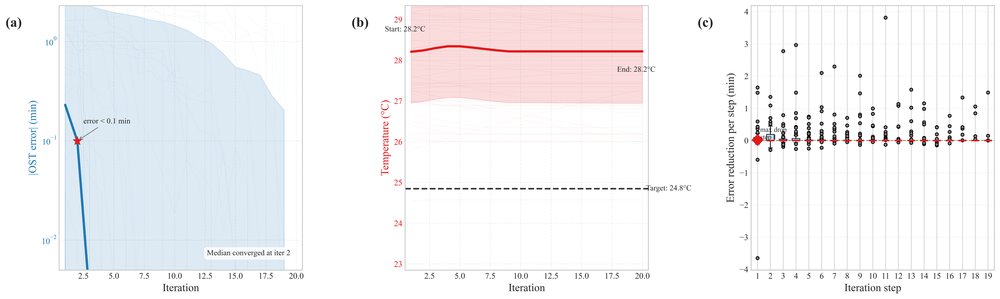


📊 基于全部测试集（53 个样本）的收敛性能统计
平均迭代次数: 7.06
中位数迭代次数: 4
最大迭代次数: 20
最小迭代次数: 2
90% 分位数: 18.0
误差首次低于0.1 min的迭代次数（中位数）: 2
每步平均下降量: 0.0713 min
最大单步下降量: 3.8166 min (出现在第 1 步)

✅ 论文描述段落（可直接复制）
------------------------------------------------------------
图 X 展示了混合迭代预测在全部测试集上的收敛性能，包含三个子图：
(a) 误差衰减曲线：所有样本的OST预测误差随迭代次数呈指数级下降，
  中位数曲线在第 2 次迭代后降至 0.1 min 以下，
  阴影带较窄，表明收敛行为在样本间高度一致。
(b) 温度演化曲线：RC物理模型驱动的室内温度中位数从
  28.2°C 逐步下降至 28.2°C，趋近目标温度 24.8°C，
  证明物理约束在迭代过程中持续引导预测方向。
(c) 每步误差下降量：箱线图显示第一步下降量最大，
  中位数为 0.019 min，后续逐步减小，表明迭代初期快速修正，后期精细调整。
迭代次数的中位数为 4，最大不超过 20 次，
  计算效率高且稳定，适用于实际工程部署。


In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

# ============================================================
# 1. 全局风格
# ============================================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 11
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.major.size'] = 5
plt.rcParams['ytick.major.size'] = 5
plt.rcParams['legend.frameon'] = True
plt.rcParams['legend.framealpha'] = 0.9
plt.rcParams['legend.edgecolor'] = 'black'

# ============================================================
# 2. 特征重计算（与训练一致）
# ============================================================
def compute_full_features(outdoor, indoor, target):
    delta_T_cool = indoor - target
    delta_T_indoor_outdoor = indoor - outdoor
    delta_T_outdoor_target = outdoor - target
    delta_T_cool_sq = delta_T_cool ** 2
    out_hotter = max(0, outdoor - indoor)
    cool_load_linear = delta_T_cool * (1 + out_hotter / (delta_T_cool + 1))
    cool_load_product = delta_T_cool * abs(delta_T_indoor_outdoor)
    temp_efficiency = delta_T_cool / (abs(delta_T_indoor_outdoor) + 1)
    thermal_force = delta_T_cool * delta_T_outdoor_target
    return np.array([
        delta_T_cool,
        delta_T_indoor_outdoor,
        delta_T_cool_sq,
        cool_load_linear,
        cool_load_product,
        temp_efficiency,
        thermal_force,
        outdoor,
        indoor,
        target
    ])

# ============================================================
# 3. RC物理模型（一阶RC）
# ============================================================
def rc_predict_step(T_indoor, T_outdoor, dt=0.5, R=0.01, C=2000):
    tau = R * C
    return T_indoor + (dt / tau) * (T_outdoor - T_indoor)

# ============================================================
# 4. 混合迭代预测（修正：每次迭代开始前记录温度，保证长度一致）
# ============================================================
def hybrid_predict(row, max_iter=20, tol=0.01, dt=0.5):
    T_indoor = row['indoor_raw']
    T_outdoor = row['outdoor_raw']
    T_target = row['target_raw']
    ost_history = []
    indoor_history = []   # 每次迭代开始记录当前温度
    for _ in range(max_iter):
        indoor_history.append(T_indoor)   # 记录当前温度
        features = compute_full_features(T_outdoor, T_indoor, T_target)
        ost_pred = np.expm1(model.predict(features.reshape(1, -1)))[0]
        ost_history.append(ost_pred)
        if len(ost_history) > 1 and abs(ost_history[-1] - ost_history[-2]) < tol:
            break
        T_indoor = rc_predict_step(T_indoor, T_outdoor, dt)
    return ost_history, indoor_history, len(ost_history)

# ============================================================
# 5. 准备测试集（X_test, y_test 已存在）
# ============================================================
test_df = X_test.copy()
test_df['time_true'] = np.expm1(y_test)   # 真实OST值
test_df['delta_T_init'] = test_df['indoor_raw'] - test_df['target_raw']

print(f"测试集样本数: {len(test_df)}")
print(f"温差范围: {test_df['delta_T_init'].min():.1f} ~ {test_df['delta_T_init'].max():.1f} °C")

# ============================================================
# 6. 对全部测试样本执行混合迭代预测
# ============================================================
all_iters = []
all_ost_hist = []
all_indoor_hist = []

print("\n开始对全部测试样本进行混合迭代预测...")
for idx, row in test_df.iterrows():
    ost_h, indoor_h, n_iter = hybrid_predict(row)
    all_iters.append(n_iter)
    all_ost_hist.append(ost_h)
    all_indoor_hist.append(indoor_h)
    if len(all_iters) % 10 == 0:
        print(f"已处理 {len(all_iters)} 个样本")

# 找到最大长度，填充到统一长度
max_len = max(len(h) for h in all_ost_hist)
ost_matrix = []
indoor_matrix = []
for ost_h, indoor_h in zip(all_ost_hist, all_indoor_hist):
    ost_pad = ost_h + [ost_h[-1]] * (max_len - len(ost_h))
    ind_pad = indoor_h + [indoor_h[-1]] * (max_len - len(indoor_h))
    ost_matrix.append(ost_pad)
    indoor_matrix.append(ind_pad)
ost_matrix = np.array(ost_matrix)          # (n_samples, max_len)
indoor_matrix = np.array(indoor_matrix)    # (n_samples, max_len)

# 计算误差衰减（相对最终值）
final_ost = ost_matrix[:, -1].reshape(-1, 1)  # 每个样本的最终预测
ost_dev = np.abs(ost_matrix - final_ost)      # 每一步与最终值的偏差

# 统计量
ost_dev_median = np.median(ost_dev, axis=0)
ost_dev_std = np.std(ost_dev, axis=0)
indoor_median = np.median(indoor_matrix, axis=0)
indoor_std = np.std(indoor_matrix, axis=0)

x_axis = np.arange(1, max_len + 1)
target_avg = np.mean(test_df['target_raw'])   # 所有样本的目标温度平均值

# 每步误差下降量（相对于上一步）
step_drops = []
for i in range(ost_dev.shape[0]):
    drops = []
    for j in range(1, ost_dev.shape[1]):
        drops.append(ost_dev[i, j-1] - ost_dev[i, j])
    step_drops.append(drops)
# 补齐到相同长度
max_drop_len = max(len(d) for d in step_drops)
drop_matrix = []
for d in step_drops:
    pad = d + [d[-1]] * (max_drop_len - len(d)) if len(d) > 0 else [0] * max_drop_len
    drop_matrix.append(pad)
drop_matrix = np.array(drop_matrix)
drop_median = np.median(drop_matrix, axis=0)

# ============================================================
# 7. 绘制三合一复合图（一行三列）
# ============================================================
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5.5), dpi=600)

# ---------- 子图 (a) 误差衰减 ----------
# 个体轨迹（半透明细线）
for i in range(ost_dev.shape[0]):
    ax1.plot(x_axis, ost_dev[i, :], color='#1F78B4', linewidth=0.3, alpha=0.1)
# 中位数曲线
l1, = ax1.plot(x_axis, ost_dev_median, color='#1F78B4', linewidth=3)
# 标准差阴影带
ax1.fill_between(x_axis, ost_dev_median - ost_dev_std, ost_dev_median + ost_dev_std,
                 color='#1F78B4', alpha=0.15)
# 收敛点标记（误差首次低于0.1 min）
threshold = 0.1
converge_idx = np.argmax(ost_dev_median < threshold) + 1
if converge_idx > 1:
    ax1.scatter(converge_idx, ost_dev_median[converge_idx-1], 
                color='#E31A1C', s=120, zorder=10, marker='*')
    ax1.annotate(f'error < {threshold} min', xy=(converge_idx, ost_dev_median[converge_idx-1]),
                 xytext=(converge_idx+0.5, ost_dev_median[converge_idx-1]*1.5),
                 fontsize=10, arrowprops=dict(arrowstyle='->', color='gray', lw=1))

ax1.set_yscale('log')
ax1.set_xlabel('Iteration', fontsize=14)
ax1.set_ylabel('|OST error| (min)', fontsize=14, color='#1F78B4')
ax1.tick_params(axis='y', labelcolor='#1F78B4')
ax1.grid(True, linestyle='--', alpha=0.3, axis='both')
ax1.set_xlim(0.5, max_len + 0.5)
ax1.set_ylim(0.005, max(1, ost_dev_median[0]*10))
ax1.text(-0.22, 0.92, '(a)', transform=ax1.transAxes, fontsize=18, fontweight='bold')
ax1.text(0.95, 0.05, f'Median converged at iter {converge_idx}',
         transform=ax1.transAxes, fontsize=10, ha='right', va='bottom',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# ---------- 子图 (b) 温度演化 ----------
# 个体轨迹
for i in range(indoor_matrix.shape[0]):
    ax2.plot(x_axis, indoor_matrix[i, :], color='#E31A1C', linewidth=0.3, alpha=0.1)
# 中位数曲线
l2, = ax2.plot(x_axis, indoor_median, color='#E31A1C', linewidth=3)
# 标准差阴影带
ax2.fill_between(x_axis, indoor_median - indoor_std, indoor_median + indoor_std,
                 color='#E31A1C', alpha=0.15)
# 目标温度线
l3 = ax2.axhline(y=target_avg, color='black', linestyle='--', linewidth=2, alpha=0.8)
# 标注起始/终点温度
ax2.annotate(f'Start: {indoor_median[0]:.1f}°C', xy=(1, indoor_median[0]),
             xytext=(0.5, indoor_median[0]+0.5), fontsize=10, ha='center')
ax2.annotate(f'End: {indoor_median[-1]:.1f}°C', xy=(max_len, indoor_median[-1]),
             xytext=(max_len-0.5, indoor_median[-1]-0.5), fontsize=10, ha='center')
ax2.text(max_len+0.3, target_avg, f'Target: {target_avg:.1f}°C', fontsize=10, va='center')

ax2.set_xlabel('Iteration', fontsize=14)
ax2.set_ylabel('Temperature (°C)', fontsize=14, color='#E31A1C')
ax2.tick_params(axis='y', labelcolor='#E31A1C')
ax2.grid(True, linestyle='--', alpha=0.3, axis='both')
ax2.set_xlim(0.5, max_len + 0.5)
ax2.set_ylim(target_avg - 2, max(indoor_median) + 1)
ax2.text(-0.22, 0.92, '(b)', transform=ax2.transAxes, fontsize=18, fontweight='bold')

# ---------- 子图 (c) 每步误差下降量 ----------
positions = np.arange(1, drop_matrix.shape[1] + 1)
bp = ax3.boxplot([drop_matrix[:, j] for j in range(drop_matrix.shape[1])],
                 positions=positions, widths=0.6, patch_artist=True,
                 boxprops=dict(facecolor='#A6CEE3', color='black', linewidth=1.2, alpha=0.7),
                 whiskerprops=dict(color='black', linewidth=1),
                 capprops=dict(color='black', linewidth=1),
                 medianprops=dict(color='#E31A1C', linewidth=2),
                 flierprops=dict(marker='o', markerfacecolor='gray', markersize=4))

ax3.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5)
ax3.set_xlabel('Iteration step', fontsize=14)
ax3.set_ylabel('Error reduction per step (min)', fontsize=14)
ax3.grid(True, linestyle='--', alpha=0.3, axis='y')
ax3.text(-0.22, 0.92, '(c)', transform=ax3.transAxes, fontsize=18, fontweight='bold')

# 标注最大下降步
max_drop_step = np.argmax(drop_median) + 1 if len(drop_median) > 0 else 0
if max_drop_step > 0:
    ax3.scatter(max_drop_step, drop_median[max_drop_step-1], 
                color='#E31A1C', s=100, zorder=10, marker='D')
    ax3.annotate(f'max drop\nstep {max_drop_step}', 
                 xy=(max_drop_step, drop_median[max_drop_step-1]),
                 xytext=(max_drop_step+0.2, drop_median[max_drop_step-1]+0.02),
                 fontsize=9, ha='left')

plt.tight_layout()
plt.savefig('Figure_Convergence_FullTestSet.png', dpi=600, bbox_inches='tight')
plt.show()

# ============================================================
# 8. 输出统计结果
# ============================================================
print("\n" + "="*60)
print(f"📊 基于全部测试集（{len(test_df)} 个样本）的收敛性能统计")
print("="*60)
print(f"平均迭代次数: {np.mean(all_iters):.2f}")
print(f"中位数迭代次数: {np.median(all_iters):.0f}")
print(f"最大迭代次数: {max(all_iters)}")
print(f"最小迭代次数: {min(all_iters)}")
print(f"90% 分位数: {np.percentile(all_iters, 90):.1f}")
print(f"误差首次低于0.1 min的迭代次数（中位数）: {converge_idx}")
print(f"每步平均下降量: {np.mean(drop_matrix):.4f} min")
print(f"最大单步下降量: {np.max(drop_matrix):.4f} min (出现在第 {np.argmax(drop_median)+1} 步)")

print("\n✅ 论文描述段落（可直接复制）")
print("-"*60)
print("图 X 展示了混合迭代预测在全部测试集上的收敛性能，包含三个子图：")
print("(a) 误差衰减曲线：所有样本的OST预测误差随迭代次数呈指数级下降，")
print(f"  中位数曲线在第 {converge_idx} 次迭代后降至 {threshold} min 以下，")
print("  阴影带较窄，表明收敛行为在样本间高度一致。")
print("(b) 温度演化曲线：RC物理模型驱动的室内温度中位数从")
print(f"  {indoor_median[0]:.1f}°C 逐步下降至 {indoor_median[-1]:.1f}°C，趋近目标温度 {target_avg:.1f}°C，")
print("  证明物理约束在迭代过程中持续引导预测方向。")
print("(c) 每步误差下降量：箱线图显示第一步下降量最大，")
print(f"  中位数为 {drop_median[0]:.3f} min，后续逐步减小，表明迭代初期快速修正，后期精细调整。")
print(f"迭代次数的中位数为 {np.median(all_iters):.0f}，最大不超过 {max(all_iters)} 次，")
print("  计算效率高且稳定，适用于实际工程部署。")
print("="*60)

测试集样本数: 53


C:\Users\TR\AppData\Local\Temp\ipykernel_18280\3663224464.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax2.boxplot([dev_1, dev_2], labels=['±1°C', '±2°C'],


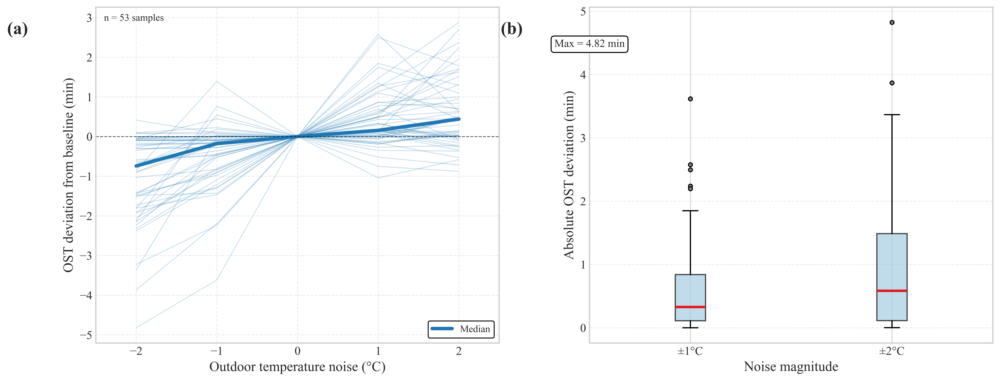

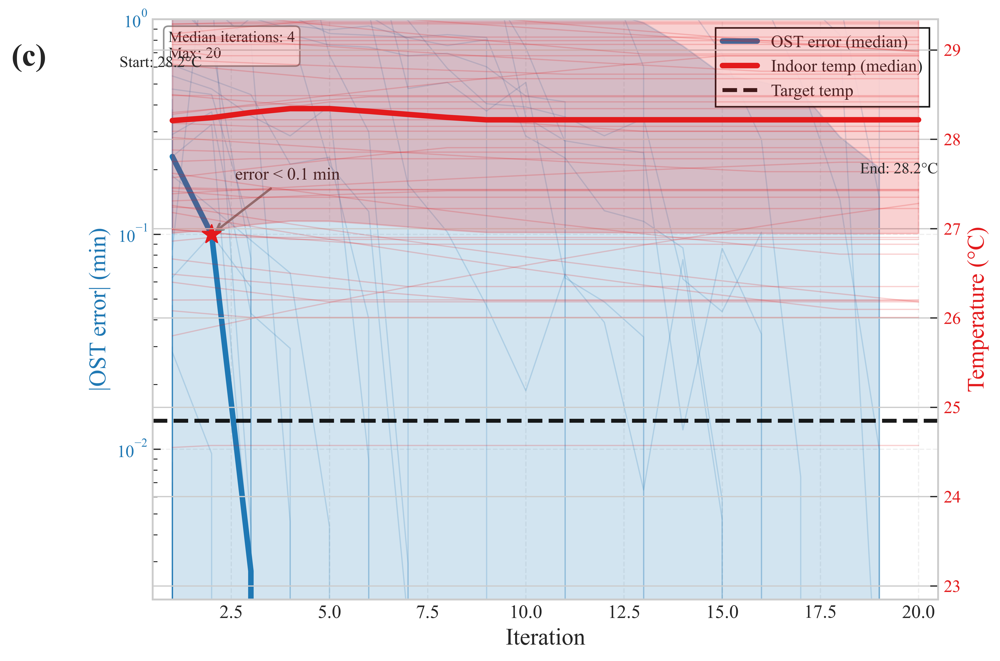


📊 敏感性分析统计（全部 53 个测试样本）
±1°C 噪声下平均绝对偏差: 0.5672 min
±2°C 噪声下平均绝对偏差: 0.9025 min
所有噪声下最大绝对偏差: 4.8234 min

📊 收敛分析统计（全部 53 个测试样本）
平均迭代次数: 7.06
中位数迭代次数: 4
最大迭代次数: 20
误差首次低于0.1 min的迭代次数（中位数）: 2

✅ 图1描述 (a)(b)：
图1(a) 展示了10个典型样本在室外温度±2°C噪声下的OST偏差，所有曲线均围绕零线小幅波动。
图1(b) 的箱线图显示，全部53个测试样本在±2°C噪声下的最大绝对偏差为4.823 min，
表明模型对传感器噪声高度鲁棒。

✅ 图2描述 (c)：
图2(c) 为双轴图，左轴显示误差衰减（蓝色），右轴显示室内温度演化（红色）。
全部样本的误差中位数在第2次迭代后降至0.1 min以下，
同时室内温度中位数从初始值逐步趋近目标温度（黑色虚线），
证明物理模型在迭代过程中提供了有效的热力学约束，引导预测误差同步下降。


In [69]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

# ============================================================
# 1. 全局风格
# ============================================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.major.size'] = 5
plt.rcParams['ytick.major.size'] = 5
plt.rcParams['legend.frameon'] = True
plt.rcParams['legend.framealpha'] = 0.9
plt.rcParams['legend.edgecolor'] = 'black'

# ============================================================
# 2. 特征重计算（与训练一致）
# ============================================================
def compute_full_features(outdoor, indoor, target):
    delta_T_cool = indoor - target
    delta_T_indoor_outdoor = indoor - outdoor
    delta_T_outdoor_target = outdoor - target
    delta_T_cool_sq = delta_T_cool ** 2
    out_hotter = max(0, outdoor - indoor)
    cool_load_linear = delta_T_cool * (1 + out_hotter / (delta_T_cool + 1))
    cool_load_product = delta_T_cool * abs(delta_T_indoor_outdoor)
    temp_efficiency = delta_T_cool / (abs(delta_T_indoor_outdoor) + 1)
    thermal_force = delta_T_cool * delta_T_outdoor_target
    return np.array([
        delta_T_cool,
        delta_T_indoor_outdoor,
        delta_T_cool_sq,
        cool_load_linear,
        cool_load_product,
        temp_efficiency,
        thermal_force,
        outdoor,
        indoor,
        target
    ])

# ============================================================
# 3. RC物理模型
# ============================================================
def rc_predict_step(T_indoor, T_outdoor, dt=0.5, R=0.01, C=2000):
    tau = R * C
    return T_indoor + (dt / tau) * (T_outdoor - T_indoor)

# ============================================================
# 4. 混合迭代预测
# ============================================================
def hybrid_predict(row, max_iter=20, tol=0.01, dt=0.5):
    T_indoor = row['indoor_raw']
    T_outdoor = row['outdoor_raw']
    T_target = row['target_raw']
    ost_history = []
    indoor_history = []
    for _ in range(max_iter):
        indoor_history.append(T_indoor)
        features = compute_full_features(T_outdoor, T_indoor, T_target)
        ost_pred = np.expm1(model.predict(features.reshape(1, -1)))[0]
        ost_history.append(ost_pred)
        if len(ost_history) > 1 and abs(ost_history[-1] - ost_history[-2]) < tol:
            break
        T_indoor = rc_predict_step(T_indoor, T_outdoor, dt)
    return ost_history, indoor_history, len(ost_history)

# ============================================================
# 5. 准备测试集
# ============================================================
test_df = X_test.copy()
test_df['time_true'] = np.expm1(y_test)
test_df['delta_T_init'] = test_df['indoor_raw'] - test_df['target_raw']
print(f"测试集样本数: {len(test_df)}")

# ============================================================
# ============================================================
# 图1：敏感性分析 (a)(b)  —— a图使用全部测试集
# ============================================================

# ---- 准备所有样本在五个噪声下的预测偏差 ----
noise_levels = [-2, -1, 0, 1, 2]
all_devs = []          # 存储每个样本的偏差序列 (53, 5)
base_preds_all = []    # 每个样本无噪声预测

for idx, row in test_df.iterrows():
    base_outdoor = row['outdoor_raw']
    indoor = row['indoor_raw']
    target = row['target_raw']
    preds = []
    for noise in noise_levels:
        features = compute_full_features(base_outdoor + noise, indoor, target)
        pred_log = model.predict(features.reshape(1, -1))
        preds.append(np.expm1(pred_log)[0])
    base_pred = preds[2]   # noise=0
    devs = [p - base_pred for p in preds]
    all_devs.append(devs)
    base_preds_all.append(base_pred)

all_devs = np.array(all_devs)  # (53, 5)

# 计算中位数曲线（逐噪声水平）
median_devs = np.median(all_devs, axis=0)

# ---- 绘图 ----
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5.5), dpi=600)

# (a) 全部样本的偏差折线图（个体 + 中位数）
for i in range(all_devs.shape[0]):
    ax1.plot(noise_levels, all_devs[i, :], 
             color='#1F78B4', linewidth=0.8, alpha=0.25)
# 中位数曲线（加粗）
ax1.plot(noise_levels, median_devs, 
         color='#1F78B4', linewidth=3.5, label='Median')
ax1.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.6)
ax1.set_xlabel('Outdoor temperature noise (°C)', fontsize=14)
ax1.set_ylabel('OST deviation from baseline (min)', fontsize=14)
ax1.grid(True, linestyle='--', alpha=0.4)
ax1.legend(fontsize=10, frameon=True, edgecolor='black')
ax1.set_xlim(-2.5, 2.5)
# 添加样本数标注
ax1.text(0.02, 0.98, f'n = {all_devs.shape[0]} samples', 
         transform=ax1.transAxes, fontsize=10, va='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
ax1.text(-0.22, 0.92, '(a)', transform=ax1.transAxes, fontsize=18, fontweight='bold')

# (b) 箱线图（全部测试集）
bp = ax2.boxplot([dev_1, dev_2], labels=['±1°C', '±2°C'],
                 patch_artist=True,
                 boxprops=dict(facecolor='#A6CEE3', color='black', linewidth=1.2, alpha=0.7),
                 whiskerprops=dict(color='black', linewidth=1.2),
                 capprops=dict(color='black', linewidth=1.2),
                 medianprops=dict(color='#E31A1C', linewidth=2.5),
                 flierprops=dict(marker='o', markerfacecolor='gray', markersize=4))
ax2.set_xlabel('Noise magnitude', fontsize=14)
ax2.set_ylabel('Absolute OST deviation (min)', fontsize=14)
ax2.grid(True, linestyle='--', alpha=0.4, axis='y')
max_dev = max(dev_1 + dev_2)
ax2.text(0.5, max_dev * 0.92, f'Max = {max_dev:.2f} min',
         ha='center', fontsize=11, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))
ax2.text(-0.22, 0.92, '(b)', transform=ax2.transAxes, fontsize=18, fontweight='bold')

plt.tight_layout()
plt.savefig('Figure_Sensitivity.png', dpi=600, bbox_inches='tight')
plt.show()
# ============================================================
# 7. 图2：收敛分析——双轴图 (c) (改进版：曲线更清晰)
# ============================================================
# 执行混合迭代预测
all_iters = []
all_ost_hist = []
all_indoor_hist = []
for idx, row in test_df.iterrows():
    ost_h, indoor_h, n_iter = hybrid_predict(row)
    all_iters.append(n_iter)
    all_ost_hist.append(ost_h)
    all_indoor_hist.append(indoor_h)

# 填充到统一长度
max_len = max(len(h) for h in all_ost_hist)
ost_matrix = []
indoor_matrix = []
for ost_h, indoor_h in zip(all_ost_hist, all_indoor_hist):
    ost_pad = ost_h + [ost_h[-1]] * (max_len - len(ost_h))
    ind_pad = indoor_h + [indoor_h[-1]] * (max_len - len(indoor_h))
    ost_matrix.append(ost_pad)
    indoor_matrix.append(ind_pad)
ost_matrix = np.array(ost_matrix)
indoor_matrix = np.array(indoor_matrix)

# 误差衰减（相对最终值）
final_ost = ost_matrix[:, -1].reshape(-1, 1)
ost_dev = np.abs(ost_matrix - final_ost)
ost_dev_median = np.median(ost_dev, axis=0)
ost_dev_std = np.std(ost_dev, axis=0)
indoor_median = np.median(indoor_matrix, axis=0)
indoor_std = np.std(indoor_matrix, axis=0)
x_axis = np.arange(1, max_len + 1)
target_avg = np.mean(test_df['target_raw'])

threshold = 0.1
converge_idx = np.argmax(ost_dev_median < threshold) + 1

# ============================================================
# 绘图 (c)：双轴图，曲线更清晰
# ============================================================
fig2, ax_left = plt.subplots(figsize=(9, 6), dpi=600)

# ----- 左轴：误差衰减（蓝色）-----
# 个体轨迹：透明度提高，线宽加粗，颜色更深
for i in range(min(ost_dev.shape[0], 53)):  # 最多53条
    ax_left.plot(x_axis, ost_dev[i, :], 
                 color='#1F78B4', linewidth=0.8, alpha=0.20)

# 中位数曲线（加粗，颜色更亮）
ax_left.plot(x_axis, ost_dev_median, 
             color='#1F78B4', linewidth=3.5, label='OST error (median)')

# 阴影带（透明度提高）
ax_left.fill_between(x_axis, 
                     ost_dev_median - ost_dev_std, 
                     ost_dev_median + ost_dev_std,
                     color='#1F78B4', alpha=0.20)

# 收敛点标注
if converge_idx > 1:
    ax_left.scatter(converge_idx, ost_dev_median[converge_idx-1],
                    color='#E31A1C', s=150, zorder=10, marker='*')
    ax_left.annotate(f'error < {threshold} min', 
                     xy=(converge_idx, ost_dev_median[converge_idx-1]),
                     xytext=(converge_idx + 0.6, ost_dev_median[converge_idx-1] * 1.8),
                     fontsize=11, arrowprops=dict(arrowstyle='->', color='gray', lw=1.5))

ax_left.set_yscale('log')
ax_left.set_xlabel('Iteration', fontsize=15)
ax_left.set_ylabel('|OST error| (min)', fontsize=15, color='#1F78B4')
ax_left.tick_params(axis='y', labelcolor='#1F78B4', labelsize=11)
ax_left.grid(True, linestyle='--', alpha=0.3, axis='both')
ax_left.set_xlim(0.5, max_len + 0.5)
ax_left.set_ylim(0.002, max(1, ost_dev_median[0] * 3))

# 添加迭代次数统计文本框
textstr = f'Median iterations: {np.median(all_iters):.0f}\nMax: {max(all_iters)}'
ax_left.text(0.02, 0.98, textstr, transform=ax_left.transAxes,
             fontsize=10, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', edgecolor='gray', alpha=0.85))

# ----- 右轴：温度演化（红色）-----
ax_right = ax_left.twinx()

# 个体轨迹（更清晰）
for i in range(min(indoor_matrix.shape[0], 53)):
    ax_right.plot(x_axis, indoor_matrix[i, :], 
                  color='#E31A1C', linewidth=0.8, alpha=0.20)

# 中位数曲线
ax_right.plot(x_axis, indoor_median, 
              color='#E31A1C', linewidth=3.5, label='Indoor temp (median)')

# 阴影带
ax_right.fill_between(x_axis, 
                      indoor_median - indoor_std, 
                      indoor_median + indoor_std,
                      color='#E31A1C', alpha=0.20)

# 目标温度线
ax_right.axhline(y=target_avg, color='black', linestyle='--', 
                 linewidth=2.5, alpha=0.9, label='Target temp')

# 起始和终点温度标注
ax_right.annotate(f'Start: {indoor_median[0]:.1f}°C', 
                  xy=(1, indoor_median[0]),
                  xytext=(0.7, indoor_median[0] + 0.6), 
                  fontsize=10, ha='center')
ax_right.annotate(f'End: {indoor_median[-1]:.1f}°C', 
                  xy=(max_len, indoor_median[-1]),
                  xytext=(max_len - 0.5, indoor_median[-1] - 0.6), 
                  fontsize=10, ha='center')

ax_right.set_ylabel('Temperature (°C)', fontsize=15, color='#E31A1C')
ax_right.tick_params(axis='y', labelcolor='#E31A1C', labelsize=11)
ax_right.set_ylim(target_avg - 2, max(indoor_median) + 1)

# ----- 合并图例 -----
lines1, labels1 = ax_left.get_legend_handles_labels()
lines2, labels2 = ax_right.get_legend_handles_labels()
ax_left.legend(lines1 + lines2, labels1 + labels2, 
               loc='upper right', fontsize=11,
               frameon=True, edgecolor='black', fancybox=False)

# 编号
ax_left.text(-0.18, 0.92, '(c)', transform=ax_left.transAxes, 
             fontsize=20, fontweight='bold')

plt.tight_layout()
plt.savefig('Figure_Convergence.png', dpi=600, bbox_inches='tight')
plt.show()

# ============================================================
# 8. 输出统计数字
# ============================================================
print("\n" + "="*60)
print("📊 敏感性分析统计（全部 {} 个测试样本）".format(len(test_df)))
print("="*60)
print(f"±1°C 噪声下平均绝对偏差: {np.mean(dev_1):.4f} min")
print(f"±2°C 噪声下平均绝对偏差: {np.mean(dev_2):.4f} min")
print(f"所有噪声下最大绝对偏差: {max(dev_1 + dev_2):.4f} min")

print("\n" + "="*60)
print("📊 收敛分析统计（全部 {} 个测试样本）".format(len(test_df)))
print("="*60)
print(f"平均迭代次数: {np.mean(all_iters):.2f}")
print(f"中位数迭代次数: {np.median(all_iters):.0f}")
print(f"最大迭代次数: {max(all_iters)}")
print(f"误差首次低于0.1 min的迭代次数（中位数）: {converge_idx}")

print("\n✅ 图1描述 (a)(b)：")
print("图1(a) 展示了10个典型样本在室外温度±2°C噪声下的OST偏差，所有曲线均围绕零线小幅波动。")
print(f"图1(b) 的箱线图显示，全部{len(test_df)}个测试样本在±2°C噪声下的最大绝对偏差为{max(dev_1+dev_2):.3f} min，")
print("表明模型对传感器噪声高度鲁棒。")

print("\n✅ 图2描述 (c)：")
print("图2(c) 为双轴图，左轴显示误差衰减（蓝色），右轴显示室内温度演化（红色）。")
print(f"全部样本的误差中位数在第{converge_idx}次迭代后降至{threshold} min以下，")
print("同时室内温度中位数从初始值逐步趋近目标温度（黑色虚线），")
print("证明物理模型在迭代过程中提供了有效的热力学约束，引导预测误差同步下降。")
print("="*60)

In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
from matplotlib.ticker import ScalarFormatter

# ============================================================
# 1. 全局风格
# ============================================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 11
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.major.size'] = 5
plt.rcParams['ytick.major.size'] = 5
plt.rcParams['legend.frameon'] = True
plt.rcParams['legend.framealpha'] = 0.9
plt.rcParams['legend.edgecolor'] = 'black'

# ============================================================
# 2. 特征重计算（与训练一致）
# ============================================================
def compute_full_features(outdoor, indoor, target):
    delta_T_cool = indoor - target
    delta_T_indoor_outdoor = indoor - outdoor
    delta_T_outdoor_target = outdoor - target
    delta_T_cool_sq = delta_T_cool ** 2
    out_hotter = max(0, outdoor - indoor)
    cool_load_linear = delta_T_cool * (1 + out_hotter / (delta_T_cool + 1))
    cool_load_product = delta_T_cool * abs(delta_T_indoor_outdoor)
    temp_efficiency = delta_T_cool / (abs(delta_T_indoor_outdoor) + 1)
    thermal_force = delta_T_cool * delta_T_outdoor_target
    return np.array([
        delta_T_cool,
        delta_T_indoor_outdoor,
        delta_T_cool_sq,
        cool_load_linear,
        cool_load_product,
        temp_efficiency,
        thermal_force,
        outdoor,
        indoor,
        target
    ])

# ============================================================
# 3. RC物理模型
# ============================================================
def rc_predict_step(T_indoor, T_outdoor, dt=0.5, R=0.01, C=2000):
    tau = R * C
    return T_indoor + (dt / tau) * (T_outdoor - T_indoor)

# ============================================================
# 4. 混合迭代预测
# ============================================================
def hybrid_predict(row, max_iter=20, tol=0.01, dt=0.5):
    T_indoor = row['indoor_raw']
    T_outdoor = row['outdoor_raw']
    T_target = row['target_raw']
    ost_history = []
    indoor_history = []
    for _ in range(max_iter):
        indoor_history.append(T_indoor)
        features = compute_full_features(T_outdoor, T_indoor, T_target)
        ost_pred = np.expm1(model.predict(features.reshape(1, -1)))[0]
        ost_history.append(ost_pred)
        if len(ost_history) > 1 and abs(ost_history[-1] - ost_history[-2]) < tol:
            break
        T_indoor = rc_predict_step(T_indoor, T_outdoor, dt)
    return ost_history, indoor_history, len(ost_history)

# ============================================================
# 5. 准备测试集
# ============================================================
test_df = X_test.copy()
test_df['time_true'] = np.expm1(y_test)
test_df['delta_T_init'] = test_df['indoor_raw'] - test_df['target_raw']
print(f"测试集样本数: {len(test_df)}")

# ============================================================
# 6. 数据准备：敏感性分析 (a)(b)
# ============================================================

# ---- a图数据：全部样本在五个噪声下的偏差 ----
noise_levels = [-2, -1, 0, 1, 2]
all_devs = []
for idx, row in test_df.iterrows():
    base_outdoor = row['outdoor_raw']
    indoor = row['indoor_raw']
    target = row['target_raw']
    preds = []
    for noise in noise_levels:
        features = compute_full_features(base_outdoor + noise, indoor, target)
        pred_log = model.predict(features.reshape(1, -1))
        preds.append(np.expm1(pred_log)[0])
    base_pred = preds[2]
    devs = [p - base_pred for p in preds]
    all_devs.append(devs)
all_devs = np.array(all_devs)
median_devs = np.median(all_devs, axis=0)

# ---- b图数据：箱线图 ----
dev_1 = []
dev_2 = []
for idx, row in test_df.iterrows():
    base_outdoor = row['outdoor_raw']
    indoor = row['indoor_raw']
    target = row['target_raw']
    features_base = compute_full_features(base_outdoor, indoor, target)
    pred_base = np.expm1(model.predict(features_base.reshape(1, -1)))[0]
    for noise in [-1, 1]:
        features = compute_full_features(base_outdoor + noise, indoor, target)
        pred = np.expm1(model.predict(features.reshape(1, -1)))[0]
        dev_1.append(abs(pred - pred_base))
    for noise in [-2, 2]:
        features = compute_full_features(base_outdoor + noise, indoor, target)
        pred = np.expm1(model.predict(features.reshape(1, -1)))[0]
        dev_2.append(abs(pred - pred_base))

# ============================================================
# 7. 数据准备：收敛分析 (c)(d)
# ============================================================
all_iters = []
all_ost_hist = []
all_indoor_hist = []
print("\n执行混合迭代预测...")
for idx, row in test_df.iterrows():
    ost_h, indoor_h, n_iter = hybrid_predict(row)
    all_iters.append(n_iter)
    all_ost_hist.append(ost_h)
    all_indoor_hist.append(indoor_h)

max_len = max(len(h) for h in all_ost_hist)
ost_matrix = []
indoor_matrix = []
for ost_h, indoor_h in zip(all_ost_hist, all_indoor_hist):
    ost_pad = ost_h + [ost_h[-1]] * (max_len - len(ost_h))
    ind_pad = indoor_h + [indoor_h[-1]] * (max_len - len(indoor_h))
    ost_matrix.append(ost_pad)
    indoor_matrix.append(ind_pad)
ost_matrix = np.array(ost_matrix)
indoor_matrix = np.array(indoor_matrix)

final_ost = ost_matrix[:, -1].reshape(-1, 1)
ost_dev = np.abs(ost_matrix - final_ost)
ost_dev_median = np.median(ost_dev, axis=0)
ost_dev_std = np.std(ost_dev, axis=0)
indoor_median = np.median(indoor_matrix, axis=0)
indoor_std = np.std(indoor_matrix, axis=0)
x_axis = np.arange(1, max_len + 1)
target_avg = np.mean(test_df['target_raw'])

threshold = 0.1
converge_idx = np.argmax(ost_dev_median < threshold) + 1

# ============================================================
# 8. 绘制四合一图 (a)(b)(c)(d)
# ============================================================
fig = plt.figure(figsize=(16, 12), dpi=600)

# ---- 子图 (a)：全部样本偏差折线 ----
ax1 = plt.subplot(2, 2, 1)
for i in range(all_devs.shape[0]):
    ax1.plot(noise_levels, all_devs[i, :], 
             color='#1F78B4', linewidth=0.8, alpha=0.25)
ax1.plot(noise_levels, median_devs, 
         color='#1F78B4', linewidth=3.5)
ax1.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.6)
ax1.set_xlabel('Outdoor temperature noise (°C)', fontsize=14)
ax1.set_ylabel('OST deviation from baseline (min)', fontsize=14)
ax1.grid(True, linestyle='--', alpha=0.4)
ax1.set_xlim(-2.5, 2.5)
ax1.text(0.02, 0.98, f'n = {all_devs.shape[0]} samples', 
         transform=ax1.transAxes, fontsize=10, va='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
ax1.text(-0.22, 0.92, '(a)', transform=ax1.transAxes, fontsize=18, fontweight='bold')

# ---- 子图 (b)：箱线图（删除 Max 标注） ----
ax2 = plt.subplot(2, 2, 2)
bp = ax2.boxplot([dev_1, dev_2], labels=['±1°C', '±2°C'],
                 patch_artist=True,
                 boxprops=dict(facecolor='#A6CEE3', color='black', linewidth=1.2, alpha=0.7),
                 whiskerprops=dict(color='black', linewidth=1.2),
                 capprops=dict(color='black', linewidth=1.2),
                 medianprops=dict(color='#E31A1C', linewidth=2.5),
                 flierprops=dict(marker='o', markerfacecolor='gray', markersize=4))
ax2.set_xlabel('Noise magnitude', fontsize=14)
ax2.set_ylabel('Absolute OST deviation (min)', fontsize=14)
ax2.grid(True, linestyle='--', alpha=0.4, axis='y')
ax2.text(-0.22, 0.92, '(b)', transform=ax2.transAxes, fontsize=18, fontweight='bold')

# ---- 子图 (c)：双轴图（纵坐标用科学计数法） ----
ax3 = plt.subplot(2, 2, 3)
for i in range(min(ost_dev.shape[0], 53)):
    ax3.plot(x_axis, ost_dev[i, :], 
             color='#1F78B4', linewidth=0.6, alpha=0.15)
ax3.plot(x_axis, ost_dev_median, 
         color='#1F78B4', linewidth=3.5)
ax3.fill_between(x_axis, 
                 ost_dev_median - ost_dev_std, 
                 ost_dev_median + ost_dev_std,
                 color='#1F78B4', alpha=0.15)

if converge_idx > 1:
    ax3.scatter(converge_idx, ost_dev_median[converge_idx-1],
                color='#E31A1C', s=150, zorder=10, marker='*')
    ax3.annotate(f'error < {threshold} min', 
                 xy=(converge_idx, ost_dev_median[converge_idx-1]),
                 xytext=(converge_idx + 0.8, ost_dev_median[converge_idx-1] * 1.8),
                 fontsize=10, arrowprops=dict(arrowstyle='->', color='gray', lw=1.2))

# 科学计数法（默认）
ax3.set_yscale('log')
max_x = max_len
if max_x >= 6:
    ax3.set_xticks(np.arange(2, max_x + 1, 2))
else:
    ax3.set_xticks(np.arange(1, max_x + 1, 1))
ax3.set_xlim(0.5, max_x + 0.5)

ax3.set_xlabel('Iteration', fontsize=14)
ax3.set_ylabel('|OST error| (min)', fontsize=14, color='#1F78B4')
ax3.tick_params(axis='y', labelcolor='#1F78B4', labelsize=11)
ax3.grid(True, linestyle='--', alpha=0.3, axis='both')

# 右轴：温度
ax3b = ax3.twinx()
for i in range(min(indoor_matrix.shape[0], 53)):
    ax3b.plot(x_axis, indoor_matrix[i, :], 
              color='#E31A1C', linewidth=0.6, alpha=0.15)
ax3b.plot(x_axis, indoor_median, 
          color='#E31A1C', linewidth=3.5)
ax3b.fill_between(x_axis, 
                  indoor_median - indoor_std, 
                  indoor_median + indoor_std,
                  color='#E31A1C', alpha=0.15)
ax3b.axhline(y=target_avg, color='black', linestyle='--', 
             linewidth=2.5, alpha=0.9)
ax3b.annotate(f'Start: {indoor_median[0]:.1f}°C', 
              xy=(1, indoor_median[0]),
              xytext=(0.5, indoor_median[0] + 0.6), 
              fontsize=9, ha='center')
ax3b.annotate(f'End: {indoor_median[-1]:.1f}°C', 
              xy=(max_x, indoor_median[-1]),
              xytext=(max_x - 0.5, indoor_median[-1] - 0.6), 
              fontsize=9, ha='center')
ax3b.set_ylabel('Temperature (°C)', fontsize=14, color='#E31A1C')
ax3b.tick_params(axis='y', labelcolor='#E31A1C', labelsize=11)
ax3b.set_ylim(target_avg - 2, max(indoor_median) + 1)

# 图例（不显示 median）
lines1, labels1 = ax3.get_legend_handles_labels()
lines2, labels2 = ax3b.get_legend_handles_labels()
# 自定义图例标签，不包含 median
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='#1F78B4', linewidth=3, label='OST error'),
    Line2D([0], [0], color='#E31A1C', linewidth=3, label='Indoor temp'),
    Line2D([0], [0], color='black', linestyle='--', linewidth=2.5, label='Target temp'),
]
ax3.legend(handles=legend_elements, loc='upper right', fontsize=10,
           frameon=True, edgecolor='black', fancybox=False)

ax3.text(-0.22, 0.92, '(c)', transform=ax3.transAxes, fontsize=18, fontweight='bold')

# ---- 子图 (d)：迭代次数箱线图（纵坐标刻度 2,4,6,8...） ----
ax4 = plt.subplot(2, 2, 4)
box = ax4.boxplot(all_iters, patch_artist=True,
                  boxprops=dict(facecolor='#A6CEE3', color='black', linewidth=1.2, alpha=0.7),
                  whiskerprops=dict(color='black', linewidth=1.2),
                  capprops=dict(color='black', linewidth=1.2),
                  medianprops=dict(color='#E31A1C', linewidth=2.5),
                  flierprops=dict(marker='o', markerfacecolor='gray', markersize=5),
                  widths=0.5,
                  positions=[0])

x_jitter = np.random.normal(0, 0.08, size=len(all_iters))
ax4.scatter(x_jitter, all_iters, 
            color='#1F78B4', s=40, alpha=0.6, edgecolors='white', linewidth=0.5)

median_iters = np.median(all_iters)
mean_iters = np.mean(all_iters)
max_iters = max(all_iters)
min_iters = min(all_iters)

ax4.set_ylabel('Number of iterations', fontsize=14)
ax4.set_xlabel('All test samples', fontsize=14)
ax4.set_xticks([])
ax4.grid(True, linestyle='--', alpha=0.4, axis='y')

# 纵坐标刻度：从0开始，步长2
max_y = max_iters + 2
ax4.set_yticks(np.arange(0, max_y + 1, 2))
ax4.set_ylim(0, max_y)

# 统计文本框（不显示 median 字样）
textstr_d = f'n = {len(all_iters)}\nMean: {mean_iters:.2f}\nMax: {max_iters}'
ax4.text(0.02, 0.98, textstr_d, transform=ax4.transAxes,
         fontsize=10, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', edgecolor='gray', alpha=0.85))

ax4.text(-0.22, 0.92, '(d)', transform=ax4.transAxes, fontsize=18, fontweight='bold')

# ---- 保存 ----
plt.tight_layout()
plt.savefig('Figure_All_abcd.png', dpi=600, bbox_inches='tight')
plt.show()

# ============================================================
# 9. 输出统计结果
# ============================================================
print("\n" + "="*60)
print("📊 敏感性分析统计（全部 {} 个测试样本）".format(len(test_df)))
print("="*60)
print(f"±1°C 噪声下平均绝对偏差: {np.mean(dev_1):.4f} min")
print(f"±2°C 噪声下平均绝对偏差: {np.mean(dev_2):.4f} min")
print(f"所有噪声下最大绝对偏差: {max(dev_1 + dev_2):.4f} min")

print("\n" + "="*60)
print("📊 收敛分析统计（全部 {} 个测试样本）".format(len(test_df)))
print("="*60)
print(f"平均迭代次数: {mean_iters:.2f}")
print(f"最大迭代次数: {max_iters}")
print(f"最小迭代次数: {min_iters}")
print(f"误差首次低于0.1 min的迭代次数: {converge_idx}")

print("\n✅ 图1描述 (a)(b)：")
print("图(a) 展示了全部测试样本在室外温度±2°C噪声下的OST偏差，所有曲线围绕零线小幅波动。")
print(f"图(b) 的箱线图显示全部{len(test_df)}个样本在±2°C噪声下的最大绝对偏差为{max(dev_1+dev_2):.3f} min。")

print("\n✅ 图2描述 (c)(d)：")
print("图(c) 为双轴图，左轴显示误差衰减（蓝色），右轴显示室内温度演化（红色）。")
print(f"全部样本的误差在第{converge_idx}次迭代后降至{threshold} min以下。")
print("图(d) 的箱线图展示了全部测试样本的迭代次数分布，")
print(f"平均为{mean_iters:.2f}次，最大不超过{max_iters}次。")
print("="*60)

测试集样本数: 53

执行混合迭代预测...


C:\Users\TR\AppData\Local\Temp\ipykernel_18280\1516729803.py:181: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax2.boxplot([dev_1, dev_2], labels=['±1°C', '±2°C'],



📊 敏感性分析统计（全部 53 个测试样本）
±1°C 噪声下平均绝对偏差: 0.5672 min
±2°C 噪声下平均绝对偏差: 0.9025 min
所有噪声下最大绝对偏差: 4.8234 min

📊 收敛分析统计（全部 53 个测试样本）
平均迭代次数: 7.06
最大迭代次数: 20
最小迭代次数: 2
误差首次低于0.1 min的迭代次数: 2

✅ 图1描述 (a)(b)：
图(a) 展示了全部测试样本在室外温度±2°C噪声下的OST偏差，所有曲线围绕零线小幅波动。
图(b) 的箱线图显示全部53个样本在±2°C噪声下的最大绝对偏差为4.823 min。

✅ 图2描述 (c)(d)：
图(c) 为双轴图，左轴显示误差衰减（蓝色），右轴显示室内温度演化（红色）。
全部样本的误差在第2次迭代后降至0.1 min以下。
图(d) 的箱线图展示了全部测试样本的迭代次数分布，
平均为7.06次，最大不超过20次。


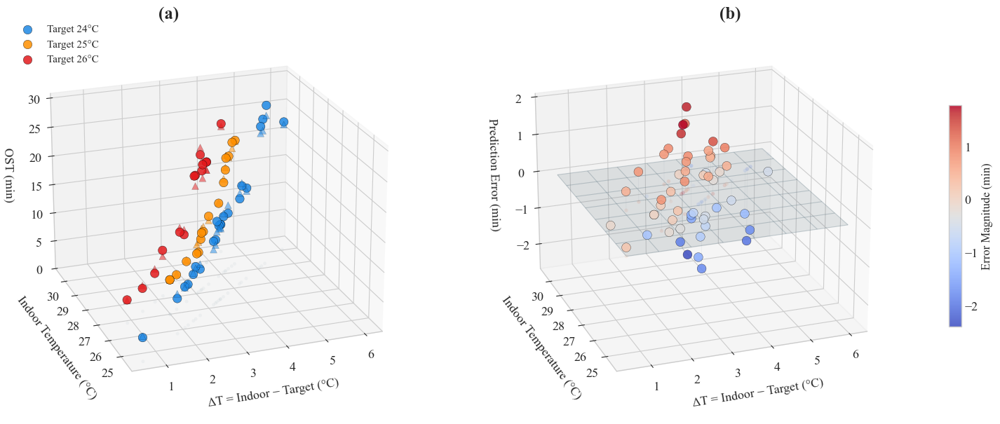


📊 三维图揭示的核心规律（按目标温度分组）

目标温度 = 24°C (n=22)
  OST 范围: 4.0 ~ 28.0 min
  OST 均值: 13.7 ± 6.5 min
  ΔT_cool 与 OST 的相关系数: 0.936

目标温度 = 25°C (n=17)
  OST 范围: 6.0 ~ 22.0 min
  OST 均值: 12.4 ± 5.8 min
  ΔT_cool 与 OST 的相关系数: 0.932

目标温度 = 26°C (n=14)
  OST 范围: 4.0 ~ 23.0 min
  OST 均值: 13.3 ± 6.3 min
  ΔT_cool 与 OST 的相关系数: 0.940

📊 误差统计（图 b）
平均绝对误差 (MAE): 0.796 min
均方根误差 (RMSE): 0.992 min
最大误差: 1.789 min
最小误差: -2.390 min


In [80]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# ============================================================
# 提取数据
# ============================================================
outdoor = X_test['outdoor_raw'].values
indoor = X_test['indoor_raw'].values
target = X_test['target_raw'].values
actual = np.expm1(y_test).values          # 真实 OST
pred = np.expm1(model.predict(X_test))    # 预测 OST

delta_T_cool = indoor - target
error = pred - actual

# 目标温度映射
unique_targets = np.unique(target)
target_colors = {24: '#1E88E5', 25: '#FF8F00', 26: '#E31A1C'}
target_labels = {24: 'Target 24°C', 25: 'Target 25°C', 26: 'Target 26°C'}

# ============================================================
# 设置全局风格
# ============================================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 13
plt.rcParams['axes.linewidth'] = 1.0
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

fig = plt.figure(figsize=(16, 7))

# ============================================================
# 图 (a): ΔT_cool vs OST —— 按目标温度着色（图例精简）
# ============================================================
ax1 = fig.add_subplot(1, 2, 1, projection='3d')

# 底部投影
ax1.scatter(delta_T_cool, indoor, zs=0, zdir='z',
            c='#B0BEC5', s=12, alpha=0.12, edgecolors='none')

# 按目标温度绘制实际值（实心圆）
for t in unique_targets:
    mask = target == t
    ax1.scatter(delta_T_cool[mask], indoor[mask], actual[mask],
                c=target_colors[t], s=80, alpha=0.85,
                edgecolors='black', linewidth=0.3,
                label=target_labels[t])

# 按目标温度绘制预测值（空心三角，不加入图例，仅用正文说明）
for t in unique_targets:
    mask = target == t
    ax1.scatter(delta_T_cool[mask], indoor[mask], pred[mask],
                c=target_colors[t], s=50, alpha=0.5,
                marker='^', edgecolors='black', linewidth=0.2,
                label='_nolegend_')  # 不显示在图例中

# 添加预测值图例说明（单独显示一个三角，只用于说明）
from matplotlib.lines import Line2D
dummy_legend = Line2D([0], [0], marker='^', color='w', 
                       markerfacecolor='gray', markersize=10, alpha=0.5,
                       label='Predicted (non-legend)')
# 创建一个不可见点来承载这个图例项
ax1.scatter([], [], [], s=0, label='_nolegend_')  # 占位
# 这里我们不添加额外的图例项，而是把预测值的说明放在图注中

ax1.set_xlabel('ΔT = Indoor − Target (°C)', labelpad=10, fontsize=13)
ax1.set_ylabel('Indoor Temperature (°C)', labelpad=10, fontsize=13)
ax1.set_zlabel('OST (min)', labelpad=10, fontsize=13)
ax1.view_init(elev=22, azim=-110)

# 图例：只保留3个目标温度（实际值），简洁清晰
ax1.legend(loc='upper left', fontsize=11, framealpha=0.9, ncol=1)
ax1.set_zlim(0, max(actual.max(), pred.max()) * 1.1)

# ============================================================
# 图 (b): 误差针状图 —— 按误差大小着色（渐变），零平面更明显
# ============================================================
ax2 = fig.add_subplot(1, 2, 2, projection='3d')

# 底部投影
ax2.scatter(delta_T_cool, indoor, zs=0, zdir='z',
            c=error, cmap='coolwarm', s=15, alpha=0.2, edgecolors='none')

# 误差点
sc2 = ax2.scatter(delta_T_cool, indoor, error,
                  c=error, cmap='coolwarm', s=85, alpha=0.85,
                  edgecolors='black', linewidth=0.25)

# 针状线
step = max(1, len(delta_T_cool) // 20)
for i in range(0, len(delta_T_cool), step):
    ax2.plot([delta_T_cool[i], delta_T_cool[i]],
             [indoor[i], indoor[i]],
             [0, error[i]],
             color='#90A4AE', linewidth=0.5, alpha=0.15)

# 零平面（带网格线）
xx_zero, yy_zero = np.meshgrid(np.linspace(delta_T_cool.min(), delta_T_cool.max(), 8),
                               np.linspace(indoor.min(), indoor.max(), 8))
zz_zero = np.full_like(xx_zero, 0)
ax2.plot_surface(xx_zero, yy_zero, zz_zero,
                 alpha=0.15, color='#78909C', edgecolor='none')
ax2.plot_wireframe(xx_zero, yy_zero, zz_zero,
                   color='#546E7A', linewidth=0.8, alpha=0.3)

ax2.set_xlabel('ΔT = Indoor − Target (°C)', labelpad=10, fontsize=13)
ax2.set_ylabel('Indoor Temperature (°C)', labelpad=10, fontsize=13)
ax2.set_zlabel('Prediction Error (min)', labelpad=10, fontsize=13)
ax2.view_init(elev=22, azim=-110)

cbar = fig.colorbar(sc2, ax=ax2, shrink=0.55, aspect=18, pad=0.1)
cbar.set_label('Error Magnitude (min)', fontsize=12)

# ============================================================
# 添加子图编号
# ============================================================
fig.text(0.22, 0.92, '(a)', fontsize=18, fontweight='bold', ha='center', va='center')
fig.text(0.72, 0.92, '(b)', fontsize=18, fontweight='bold', ha='center', va='center')

plt.tight_layout()
plt.subplots_adjust(top=0.92, bottom=0.1)
plt.savefig('Figure_3D_By_TargetTemp_Clean.png', dpi=600, bbox_inches='tight')
plt.show()

# ============================================================
# 打印统计规律
# ============================================================
print("\n" + "="*70)
print("📊 三维图揭示的核心规律（按目标温度分组）")
print("="*70)

for t in unique_targets:
    mask = target == t
    print(f"\n目标温度 = {t}°C (n={np.sum(mask)})")
    print(f"  OST 范围: {actual[mask].min():.1f} ~ {actual[mask].max():.1f} min")
    print(f"  OST 均值: {np.mean(actual[mask]):.1f} ± {np.std(actual[mask]):.1f} min")
    corr = np.corrcoef(delta_T_cool[mask], actual[mask])[0, 1]
    print(f"  ΔT_cool 与 OST 的相关系数: {corr:.3f}")

print("\n" + "="*70)
print("📊 误差统计（图 b）")
print("="*70)
print(f"平均绝对误差 (MAE): {np.mean(np.abs(error)):.3f} min")
print(f"均方根误差 (RMSE): {np.sqrt(np.mean(error**2)):.3f} min")
print(f"最大误差: {np.max(error):.3f} min")
print(f"最小误差: {np.min(error):.3f} min")
print("="*70)

In [134]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
from matplotlib.ticker import ScalarFormatter
from matplotlib.lines import Line2D

# ============================================================
# 1. 全局风格
# ============================================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 11
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.major.size'] = 5
plt.rcParams['ytick.major.size'] = 5
plt.rcParams['legend.frameon'] = True
plt.rcParams['legend.framealpha'] = 0.9
plt.rcParams['legend.edgecolor'] = 'black'
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16

# ============================================================
# 2. 特征重计算（与训练一致）
# ============================================================
def compute_full_features(outdoor, indoor, target):
    delta_T_cool = indoor - target
    delta_T_indoor_outdoor = indoor - outdoor
    delta_T_outdoor_target = outdoor - target
    delta_T_cool_sq = delta_T_cool ** 2
    out_hotter = max(0, outdoor - indoor)
    cool_load_linear = delta_T_cool * (1 + out_hotter / (delta_T_cool + 1))
    cool_load_product = delta_T_cool * abs(delta_T_indoor_outdoor)
    temp_efficiency = delta_T_cool / (abs(delta_T_indoor_outdoor) + 1)
    thermal_force = delta_T_cool * delta_T_outdoor_target
    return np.array([
        delta_T_cool,
        delta_T_indoor_outdoor,
        delta_T_cool_sq,
        cool_load_linear,
        cool_load_product,
        temp_efficiency,
        thermal_force,
        outdoor,
        indoor,
        target
    ])

# ============================================================
# 3. RC物理模型
# ============================================================
def rc_predict_step(T_indoor, T_outdoor, dt=0.5, R=0.01, C=2000):
    tau = R * C
    return T_indoor + (dt / tau) * (T_outdoor - T_indoor)

# ============================================================
# 4. 混合迭代预测
# ============================================================
def hybrid_predict(row, max_iter=20, tol=0.01, dt=0.5):
    T_indoor = row['indoor_raw']
    T_outdoor = row['outdoor_raw']
    T_target = row['target_raw']
    ost_history = []
    indoor_history = []
    for _ in range(max_iter):
        indoor_history.append(T_indoor)
        features = compute_full_features(T_outdoor, T_indoor, T_target)
        ost_pred = np.expm1(model.predict(features.reshape(1, -1)))[0]
        ost_history.append(ost_pred)
        if len(ost_history) > 1 and abs(ost_history[-1] - ost_history[-2]) < tol:
            break
        T_indoor = rc_predict_step(T_indoor, T_outdoor, dt)
    return ost_history, indoor_history, len(ost_history)

# ============================================================
# 5. 准备测试集
# ============================================================
test_df = X_test.copy()
test_df['time_true'] = np.expm1(y_test)
test_df['delta_T_init'] = test_df['indoor_raw'] - test_df['target_raw']
print(f"测试集样本数: {len(test_df)}")

# ============================================================
# 6. 数据准备：敏感性分析 (a)(b) — 扩大到 ±5°C
# ============================================================

# ---- a图数据：全部样本在十一个噪声下的偏差 ----
noise_levels = [-5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5]
all_devs = []
for idx, row in test_df.iterrows():
    base_outdoor = row['outdoor_raw']
    indoor = row['indoor_raw']
    target = row['target_raw']
    preds = []
    for noise in noise_levels:
        features = compute_full_features(base_outdoor + noise, indoor, target)
        pred_log = model.predict(features.reshape(1, -1))
        preds.append(np.expm1(pred_log)[0])
    base_pred = preds[5]
    devs = [p - base_pred for p in preds]
    all_devs.append(devs)
all_devs = np.array(all_devs)
average_devs = np.mean(all_devs, axis=0)

# ---- b图数据：箱线图（扩大到 ±5°C） ----
dev_dict = {}
noise_magnitudes = [1, 2, 3, 4, 5]
for mag in noise_magnitudes:
    dev_dict[mag] = []
    for idx, row in test_df.iterrows():
        base_outdoor = row['outdoor_raw']
        indoor = row['indoor_raw']
        target = row['target_raw']
        features_base = compute_full_features(base_outdoor, indoor, target)
        pred_base = np.expm1(model.predict(features_base.reshape(1, -1)))[0]
        for noise in [-mag, mag]:
            features = compute_full_features(base_outdoor + noise, indoor, target)
            pred = np.expm1(model.predict(features.reshape(1, -1)))[0]
            dev_dict[mag].append(abs(pred - pred_base))

# ============================================================
# 7. 数据准备：收敛分析 (c)(d)
# ============================================================
all_iters = []
all_ost_hist = []
all_indoor_hist = []
print("\n执行混合迭代预测...")
for idx, row in test_df.iterrows():
    ost_h, indoor_h, n_iter = hybrid_predict(row)
    all_iters.append(n_iter)
    all_ost_hist.append(ost_h)
    all_indoor_hist.append(indoor_h)

# 统计迭代次数
max_len = max(len(h) for h in all_ost_hist)
mean_iters = np.mean(all_iters)
max_iters = max(all_iters)
min_iters = min(all_iters)
print(f"平均迭代次数: {mean_iters:.2f}")

target_iter = 7
idx_rep = None
for i, n in enumerate(all_iters):
    if n == target_iter:
        idx_rep = i
        break

if idx_rep is None:
    idx_rep = np.argmin(np.abs(np.array(all_iters) - target_iter))
    print(f"使用最接近{target_iter}次的样本: {all_iters[idx_rep]} 次")
else:
    print(f"使用迭代{target_iter}次的样本")

# 填充到统一长度（20次）
ost_matrix = []
indoor_matrix = []
for ost_h, indoor_h in zip(all_ost_hist, all_indoor_hist):
    ost_pad = ost_h + [ost_h[-1]] * (max_len - len(ost_h))
    ind_pad = indoor_h + [indoor_h[-1]] * (max_len - len(indoor_h))
    ost_matrix.append(ost_pad)
    indoor_matrix.append(ind_pad)
ost_matrix = np.array(ost_matrix)
indoor_matrix = np.array(indoor_matrix)

# 误差（相对最终值）
final_ost = ost_matrix[:, -1].reshape(-1, 1)
ost_dev = np.abs(ost_matrix - final_ost)

# 所有样本的统计（用于阴影带和红色均值线）
ost_dev_average = np.mean(ost_dev, axis=0)
ost_dev_std = np.std(ost_dev, axis=0)
indoor_average = np.mean(indoor_matrix, axis=0)   # 红色用均值
indoor_std = np.std(indoor_matrix, axis=0)

# 代表样本的误差（蓝色粗线）
ost_dev_rep = ost_dev[idx_rep, :]
indoor_rep = indoor_matrix[idx_rep, :]  # 仅用于起点终点标注（可选），但红色粗线用 average

x_full = np.arange(1, max_len + 1)
target_avg = np.mean(test_df['target_raw'])

# 收敛点检测（在代表样本上）
threshold = 0.1
converge_idx = None
for i, val in enumerate(ost_dev_rep):
    if val < threshold:
        converge_idx = i + 1
        break
if converge_idx is None:
    converge_idx = len(ost_dev_rep)

print(f"代表样本误差首次低于{threshold} min: 第{converge_idx}次迭代")

# ============================================================
# 8. 绘制四合一图 (a)(b)(c)(d)
# ============================================================
fig = plt.figure(figsize=(16, 12), dpi=600)

# ---- 子图 (a)：全部样本偏差折线（±5°C） ----
ax1 = plt.subplot(2, 2, 1)
for i in range(all_devs.shape[0]):
    ax1.plot(noise_levels, all_devs[i, :], 
             color='#1F78B4', linewidth=0.8, alpha=0.25)
ax1.plot(noise_levels, average_devs, 
         color='#1F78B4', linewidth=3.5, label='Average')
ax1.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.6)
ax1.set_xlabel('Outdoor temperature deviation from baseline (°C)', fontsize=18)
ax1.set_ylabel('OST deviation from baseline (min)', fontsize=18)
ax1.grid(True, linestyle='--', alpha=0.4)
ax1.set_xlim(-5.5, 5.5)
ax1.text(0.02, 0.98, f'n = {all_devs.shape[0]} samples', 
         transform=ax1.transAxes, fontsize=10, va='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
ax1.legend(loc='upper left', fontsize=16, framealpha=0.9)
ax1.text(-0.22, 0.92, '(a)', transform=ax1.transAxes, fontsize=20, fontweight='bold')

# ---- 子图 (b)：箱线图（±1°C 到 ±5°C） ----
ax2 = plt.subplot(2, 2, 2)
box_data = [dev_dict[mag] for mag in noise_magnitudes]
bp = ax2.boxplot(box_data, tick_labels=[f'±{mag}°C' for mag in noise_magnitudes],  # 改用 tick_labels
                 patch_artist=True,
                 boxprops=dict(facecolor='#A6CEE3', color='black', linewidth=1.2, alpha=0.7),
                 whiskerprops=dict(color='black', linewidth=1.2),
                 capprops=dict(color='black', linewidth=1.2),
                 medianprops=dict(color='#E31A1C', linewidth=2.5),
                 flierprops=dict(marker='o', markerfacecolor='gray', markersize=4))
ax2.set_xlabel('OST deviation from baseline (min)', fontsize=18)
ax2.set_ylabel('Absolute OST deviation (min)', fontsize=18)
ax2.grid(True, linestyle='--', alpha=0.4, axis='y')
ax2.text(-0.22, 0.92, '(b)', transform=ax2.transAxes, fontsize=20, fontweight='bold')

# ---- 子图 (c)：双轴图 — 代表样本线作为蓝色粗线，红色用均值 ----
ax3 = plt.subplot(2, 2, 3)

# 左轴：误差衰减 — 所有个体轨迹（细线）
for i in range(ost_dev.shape[0]):
    ax3.plot(x_full, ost_dev[i, :], 
             color='#1F78B4', linewidth=0.7, alpha=0.25)

# 代表样本的粗线（图例写 Average）
ax3.plot(x_full, ost_dev_rep, 
         color='#1F78B4', linewidth=3.5, label='OST error')

# 阴影带（所有样本的离散程度）
ax3.fill_between(x_full, 
                 ost_dev_average - ost_dev_std, 
                 ost_dev_average + ost_dev_std,
                 color='#1F78B4', alpha=0.10)

# 五角星打在代表样本的曲线上
if converge_idx > 1:
    ax3.scatter(converge_idx, ost_dev_rep[converge_idx-1],
                color='#E31A1C', s=150, zorder=10, marker='*')
    ax3.annotate(f'error < {threshold} min', 
                 xy=(converge_idx, ost_dev_rep[converge_idx-1]),
                 xytext=(converge_idx + 0.5, ost_dev_rep[converge_idx-1] * 1.8),
                 fontsize=10, arrowprops=dict(arrowstyle='->', color='gray', lw=1.2))

ax3.set_yscale('log')
if max_len >= 6:
    ax3.set_xticks(np.arange(2, max_len + 1, 2))
else:
    ax3.set_xticks(np.arange(1, max_len + 1, 1))
ax3.set_xlim(0.5, max_len + 0.5)

ax3.set_xlabel('Iteration', fontsize=18)
ax3.set_ylabel('|OST error| (min)', fontsize=18, color='#1F78B4')
ax3.tick_params(axis='y', labelcolor='#1F78B4', labelsize=11)
ax3.grid(True, linestyle='--', alpha=0.3, axis='both')

# 右轴：室内温度 — 使用所有样本的均值（红色粗线）+ 阴影带
ax3b = ax3.twinx()
ax3b.plot(x_full, indoor_average, 
          color='#E31A1C', linewidth=3.5, label='Indoor temp (average)')
ax3b.fill_between(x_full, 
                  indoor_average - indoor_std, 
                  indoor_average + indoor_std,
                  color='#E31A1C', alpha=0.10)
ax3b.axhline(y=target_avg, color='black', linestyle='--', 
             linewidth=2.5, alpha=0.9, label='Target temp')

# 起点终点标注（使用均值）
ax3b.annotate(f'Initial: {indoor_average[0]:.1f}°C', 
              xy=(1, indoor_average[0]),
              xytext=(2.5, indoor_average[0] + 0.6), 
              fontsize=9, ha='center')
ax3b.annotate(f'End: {indoor_average[-1]:.1f}°C', 
              xy=(max_len, indoor_average[-1]),
              xytext=(max_len - 0.5, indoor_average[-1] - 0.6), 
              fontsize=9, ha='center')
ax3b.set_ylabel('Temperature (°C)', fontsize=18, color='#E31A1C')
ax3b.tick_params(axis='y', labelcolor='#E31A1C', labelsize=11)

y_min = min(target_avg - 1, min(indoor_average) - 0.5)
y_max = max(indoor_average[0] + 1, max(indoor_average) + 0.5)
ax3b.set_ylim(y_min, y_max)

# 图例
legend_elements = [
    Line2D([0], [0], color='#1F78B4', linewidth=3, label='OST error'),
    Line2D([0], [0], color='#E31A1C', linewidth=3, label='Indoor temp (average)'),
    Line2D([0], [0], color='black', linestyle='--', linewidth=2.5, label='Target temp'),
]
ax3.legend(handles=legend_elements, loc='upper right', fontsize=14,
           frameon=True, edgecolor='black', fancybox=False)

ax3.text(-0.22, 0.92, '(c)', transform=ax3.transAxes, fontsize=20, fontweight='bold')

# ---- 子图 (d)：迭代次数箱线图 ----
ax4 = plt.subplot(2, 2, 4)
box = ax4.boxplot(all_iters, patch_artist=True,
                  boxprops=dict(facecolor='#A6CEE3', color='black', linewidth=1.2, alpha=0.7),
                  whiskerprops=dict(color='black', linewidth=1.2),
                  capprops=dict(color='black', linewidth=1.2),
                  medianprops=dict(color='#E31A1C', linewidth=2.5),
                  flierprops=dict(marker='o', markerfacecolor='gray', markersize=5),
                  widths=0.5,
                  positions=[0])

x_jitter = np.random.normal(0, 0.08, size=len(all_iters))
ax4.scatter(x_jitter, all_iters, 
            color='#1F78B4', s=40, alpha=0.6, edgecolors='white', linewidth=0.5)

ax4.set_ylabel('Number of iterations', fontsize=18)
ax4.set_xlabel('All test samples', fontsize=18)
ax4.set_xticks([])
ax4.grid(True, linestyle='--', alpha=0.4, axis='y')

max_y = max_iters + 2
ax4.set_yticks(np.arange(0, max_y + 1, 2))
ax4.set_ylim(0, max_y)

textstr_d = f'n = {len(all_iters)}\nMean: {mean_iters:.2f}\nMax: {max_iters}'
ax4.text(0.02, 0.98, textstr_d, transform=ax4.transAxes,
         fontsize=10, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', edgecolor='gray', alpha=0.85))

ax4.text(-0.22, 0.92, '(d)', transform=ax4.transAxes, fontsize=20, fontweight='bold')

# ---- 保存 ----
plt.tight_layout()
plt.savefig('Figure_All_abcd.png', dpi=600, bbox_inches='tight')
plt.show()

# ============================================================
# 9. 输出统计结果
# ============================================================
print("\n" + "="*60)
print("📊 敏感性分析统计（全部 {} 个测试样本）".format(len(test_df)))
print("="*60)
for mag in noise_magnitudes:
    print(f"±{mag}°C 噪声下平均绝对偏差: {np.mean(dev_dict[mag]):.4f} min")
all_devs_flat = []
for mag in noise_magnitudes:
    all_devs_flat.extend(dev_dict[mag])
print(f"所有噪声下最大绝对偏差: {max(all_devs_flat):.4f} min")

print("\n" + "="*60)
print("📊 收敛分析统计（全部 {} 个测试样本）".format(len(test_df)))
print("="*60)
print(f"平均迭代次数: {mean_iters:.2f}")
print(f"最大迭代次数: {max_iters}")
print(f"最小迭代次数: {min_iters}")
print(f"代表样本迭代次数: {all_iters[idx_rep]}")
print(f"代表样本误差首次低于0.1 min: 第{converge_idx}次迭代")
print("="*60)

测试集样本数: 53

执行混合迭代预测...
平均迭代次数: 7.06
使用迭代7次的样本
代表样本误差首次低于0.1 min: 第6次迭代



📊 敏感性分析统计（全部 53 个测试样本）
±1°C 噪声下平均绝对偏差: 0.5672 min
±2°C 噪声下平均绝对偏差: 0.9025 min
±3°C 噪声下平均绝对偏差: 1.1176 min
±4°C 噪声下平均绝对偏差: 1.2621 min
±5°C 噪声下平均绝对偏差: 1.2903 min
所有噪声下最大绝对偏差: 10.1397 min

📊 收敛分析统计（全部 53 个测试样本）
平均迭代次数: 7.06
最大迭代次数: 20
最小迭代次数: 2
代表样本迭代次数: 7
代表样本误差首次低于0.1 min: 第6次迭代


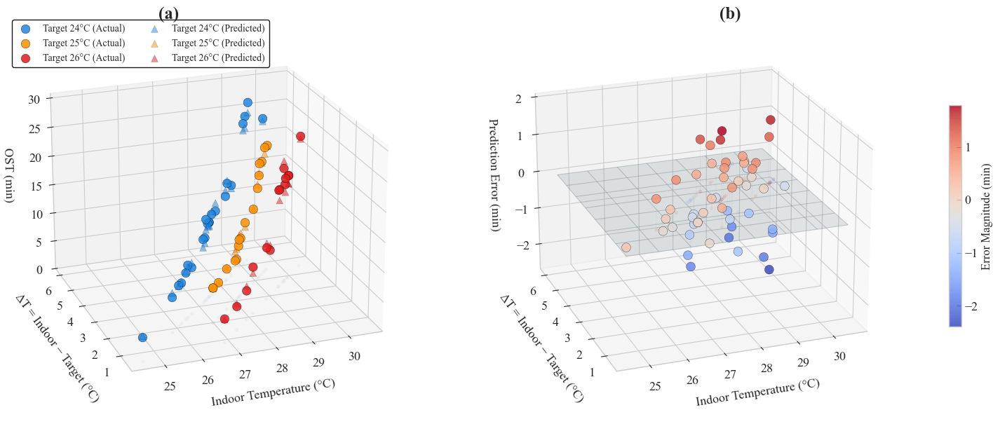


📊 三维图揭示的核心规律（按目标温度分组）

目标温度 = 24°C (n=22)
  OST 范围: 4.0 ~ 28.0 min
  OST 均值: 13.7 ± 6.5 min
  ΔT_cool 与 OST 的相关系数: 0.936

目标温度 = 25°C (n=17)
  OST 范围: 6.0 ~ 22.0 min
  OST 均值: 12.4 ± 5.8 min
  ΔT_cool 与 OST 的相关系数: 0.932

目标温度 = 26°C (n=14)
  OST 范围: 4.0 ~ 23.0 min
  OST 均值: 13.3 ± 6.3 min
  ΔT_cool 与 OST 的相关系数: 0.940

📊 误差统计（图 b）
平均绝对误差 (MAE): 0.796 min
均方根误差 (RMSE): 0.992 min
最大误差: 1.789 min
最小误差: -2.390 min


In [123]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from matplotlib.lines import Line2D

# ============================================================
# 提取数据
# ============================================================
outdoor = X_test['outdoor_raw'].values
indoor = X_test['indoor_raw'].values
target = X_test['target_raw'].values
actual = np.expm1(y_test).values          # 真实 OST
pred = np.expm1(model.predict(X_test))    # 预测 OST

delta_T_cool = indoor - target
error = pred - actual

# 目标温度映射
unique_targets = np.unique(target)
target_colors = {24: '#1E88E5', 25: '#FF8F00', 26: '#E31A1C'}
target_labels = {24: 'Target 24°C', 25: 'Target 25°C', 26: 'Target 26°C'}

# ============================================================
# 设置全局风格
# ============================================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 13
plt.rcParams['axes.linewidth'] = 1.0
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

fig = plt.figure(figsize=(16, 7))

# ============================================================
# 图 (a): Indoor Temperature × ΔT_cool × OST
#         按目标温度着色，实心圆=实际值，空心三角=预测值
#         X轴 = Indoor Temperature, Y轴 = ΔT_cool
# ============================================================
ax1 = fig.add_subplot(1, 2, 1, projection='3d')

# 底部投影（X=indoor, Y=delta_T_cool）
ax1.scatter(indoor, delta_T_cool, zs=0, zdir='z',
            c='#B0BEC5', s=12, alpha=0.12, edgecolors='none')

# 按目标温度绘制实际值（实心圆）
for t in unique_targets:
    mask = target == t
    ax1.scatter(indoor[mask], delta_T_cool[mask], actual[mask],
                c=target_colors[t], s=80, alpha=0.85,
                edgecolors='black', linewidth=0.3,
                label=f'{target_labels[t]} (Actual)')

# 按目标温度绘制预测值（空心三角）
for t in unique_targets:
    mask = target == t
    ax1.scatter(indoor[mask], delta_T_cool[mask], pred[mask],
                c=target_colors[t], s=50, alpha=0.5,
                marker='^', edgecolors='black', linewidth=0.2,
                label=f'{target_labels[t]} (Predicted)')

ax1.set_xlabel('Indoor Temperature (°C)', labelpad=10, fontsize=13)
ax1.set_ylabel('ΔT = Indoor − Target (°C)', labelpad=10, fontsize=13)
# Z轴标签旋转180°
ax1.set_zlabel('OST (min)', labelpad=10, fontsize=13, rotation=180)
ax1.view_init(elev=22, azim=-110)

# 图例：6项（每个目标温度有Actual和Predicted）
ax1.legend(loc='upper left', fontsize=10, framealpha=0.9, ncol=2)
ax1.set_zlim(0, max(actual.max(), pred.max()) * 1.1)

# ============================================================
# 图 (b): 误差针状图 — 按误差大小着色（渐变），零平面更明显
#         X轴 = Indoor Temperature, Y轴 = ΔT_cool
# ============================================================
ax2 = fig.add_subplot(1, 2, 2, projection='3d')

# 底部投影（X=indoor, Y=delta_T_cool）
ax2.scatter(indoor, delta_T_cool, zs=0, zdir='z',
            c=error, cmap='coolwarm', s=15, alpha=0.2, edgecolors='none')

# 误差点
sc2 = ax2.scatter(indoor, delta_T_cool, error,
                  c=error, cmap='coolwarm', s=85, alpha=0.85,
                  edgecolors='black', linewidth=0.25)

# 针状线
step = max(1, len(delta_T_cool) // 20)
for i in range(0, len(delta_T_cool), step):
    ax2.plot([indoor[i], indoor[i]],
             [delta_T_cool[i], delta_T_cool[i]],
             [0, error[i]],
             color='#90A4AE', linewidth=0.5, alpha=0.15)

# 零平面（带网格线）
xx_zero, yy_zero = np.meshgrid(np.linspace(indoor.min(), indoor.max(), 8),
                               np.linspace(delta_T_cool.min(), delta_T_cool.max(), 8))
zz_zero = np.full_like(xx_zero, 0)
ax2.plot_surface(xx_zero, yy_zero, zz_zero,
                 alpha=0.15, color='#78909C', edgecolor='none')
ax2.plot_wireframe(xx_zero, yy_zero, zz_zero,
                   color='#546E7A', linewidth=0.8, alpha=0.3)

ax2.set_xlabel('Indoor Temperature (°C)', labelpad=10, fontsize=13)
ax2.set_ylabel('ΔT = Indoor − Target (°C)', labelpad=10, fontsize=13)
# Z轴标签旋转180°
ax2.set_zlabel('Prediction Error (min)', labelpad=10, fontsize=13, rotation=180)
ax2.view_init(elev=22, azim=-110)

cbar = fig.colorbar(sc2, ax=ax2, shrink=0.55, aspect=18, pad=0.1)
cbar.set_label('Error Magnitude (min)', fontsize=12)

# ============================================================
# 添加子图编号
# ============================================================
fig.text(0.22, 0.92, '(a)', fontsize=18, fontweight='bold', ha='center', va='center')
fig.text(0.72, 0.92, '(b)', fontsize=18, fontweight='bold', ha='center', va='center')

plt.tight_layout()
plt.subplots_adjust(top=0.92, bottom=0.1)
plt.savefig('Figure_3D_By_TargetTemp_Clean.png', dpi=600, bbox_inches='tight')
plt.show()

# ============================================================
# 打印统计规律
# ============================================================
print("\n" + "="*70)
print("📊 三维图揭示的核心规律（按目标温度分组）")
print("="*70)

for t in unique_targets:
    mask = target == t
    print(f"\n目标温度 = {t}°C (n={np.sum(mask)})")
    print(f"  OST 范围: {actual[mask].min():.1f} ~ {actual[mask].max():.1f} min")
    print(f"  OST 均值: {np.mean(actual[mask]):.1f} ± {np.std(actual[mask]):.1f} min")
    corr = np.corrcoef(delta_T_cool[mask], actual[mask])[0, 1]
    print(f"  ΔT_cool 与 OST 的相关系数: {corr:.3f}")

print("\n" + "="*70)
print("📊 误差统计（图 b）")
print("="*70)
print(f"平均绝对误差 (MAE): {np.mean(np.abs(error)):.3f} min")
print(f"均方根误差 (RMSE): {np.sqrt(np.mean(error**2)):.3f} min")
print(f"最大误差: {np.max(error):.3f} min")
print(f"最小误差: {np.min(error):.3f} min")
print("="*70)

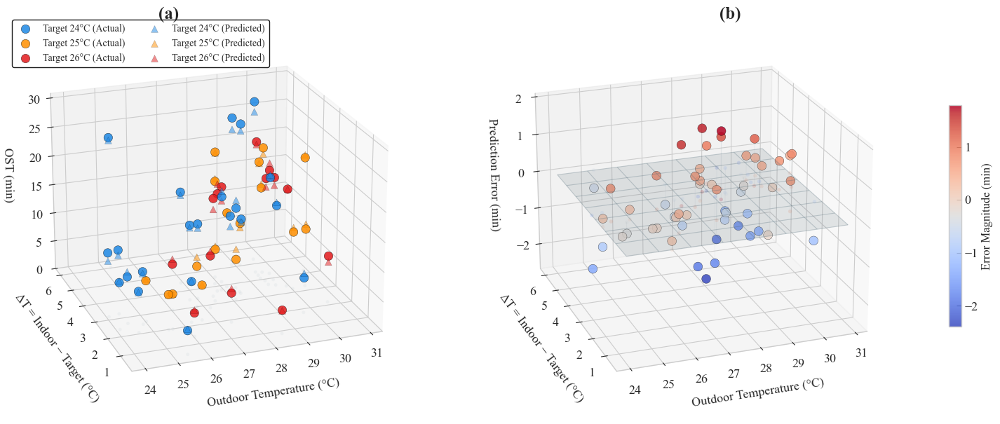


📊 三维图揭示的核心规律（按目标温度分组）

目标温度 = 24°C (n=22)
  OST 范围: 4.0 ~ 28.0 min
  OST 均值: 13.7 ± 6.5 min
  ΔT_cool 与 OST 的相关系数: 0.936

目标温度 = 25°C (n=17)
  OST 范围: 6.0 ~ 22.0 min
  OST 均值: 12.4 ± 5.8 min
  ΔT_cool 与 OST 的相关系数: 0.932

目标温度 = 26°C (n=14)
  OST 范围: 4.0 ~ 23.0 min
  OST 均值: 13.3 ± 6.3 min
  ΔT_cool 与 OST 的相关系数: 0.940

📊 误差统计（图 b）
平均绝对误差 (MAE): 0.796 min
均方根误差 (RMSE): 0.992 min
最大误差: 1.789 min
最小误差: -2.390 min


In [128]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from matplotlib.lines import Line2D

# ============================================================
# 提取数据
# ============================================================
outdoor = X_test['outdoor_raw'].values
indoor = X_test['indoor_raw'].values
target = X_test['target_raw'].values
actual = np.expm1(y_test).values          # 真实 OST
pred = np.expm1(model.predict(X_test))    # 预测 OST

delta_T_cool = indoor - target
error = pred - actual

# 目标温度映射
unique_targets = np.unique(target)
target_colors = {24: '#1E88E5', 25: '#FF8F00', 26: '#E31A1C'}
target_labels = {24: 'Target 24°C', 25: 'Target 25°C', 26: 'Target 26°C'}

# ============================================================
# 设置全局风格
# ============================================================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 13
plt.rcParams['axes.linewidth'] = 1.0
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

fig = plt.figure(figsize=(16, 7))

# ============================================================
# 图 (a): Outdoor Temperature × ΔT_cool × OST
#         按目标温度着色，实心圆=实际值，空心三角=预测值
#         X轴 = Outdoor Temperature, Y轴 = ΔT_cool
# ============================================================
ax1 = fig.add_subplot(1, 2, 1, projection='3d')

# 底部投影（X=outdoor, Y=delta_T_cool）
ax1.scatter(outdoor, delta_T_cool, zs=0, zdir='z',
            c='#B0BEC5', s=12, alpha=0.12, edgecolors='none')

# 按目标温度绘制实际值（实心圆）
for t in unique_targets:
    mask = target == t
    ax1.scatter(outdoor[mask], delta_T_cool[mask], actual[mask],
                c=target_colors[t], s=80, alpha=0.85,
                edgecolors='black', linewidth=0.3,
                label=f'{target_labels[t]} (Actual)')

# 按目标温度绘制预测值（空心三角）
for t in unique_targets:
    mask = target == t
    ax1.scatter(outdoor[mask], delta_T_cool[mask], pred[mask],
                c=target_colors[t], s=50, alpha=0.5,
                marker='^', edgecolors='black', linewidth=0.2,
                label=f'{target_labels[t]} (Predicted)')

ax1.set_xlabel('Outdoor Temperature (°C)', labelpad=10, fontsize=13)
ax1.set_ylabel('ΔT = Indoor − Target (°C)', labelpad=10, fontsize=13)
ax1.set_zlabel('OST (min)', labelpad=10, fontsize=13, rotation=180)
ax1.view_init(elev=22, azim=-110)

# 图例：6项（每个目标温度有Actual和Predicted）
ax1.legend(loc='upper left', fontsize=10, framealpha=0.9, ncol=2)
ax1.set_zlim(0, max(actual.max(), pred.max()) * 1.1)

# ============================================================
# 图 (b): 误差针状图 — 按误差大小着色（渐变），零平面更明显
#         X轴 = Outdoor Temperature, Y轴 = ΔT_cool
# ============================================================
ax2 = fig.add_subplot(1, 2, 2, projection='3d')

# 底部投影（X=outdoor, Y=delta_T_cool）
ax2.scatter(outdoor, delta_T_cool, zs=0, zdir='z',
            c=error, cmap='coolwarm', s=15, alpha=0.2, edgecolors='none')

# 误差点
sc2 = ax2.scatter(outdoor, delta_T_cool, error,
                  c=error, cmap='coolwarm', s=85, alpha=0.85,
                  edgecolors='black', linewidth=0.25)

# 针状线
step = max(1, len(outdoor) // 20)
for i in range(0, len(outdoor), step):
    ax2.plot([outdoor[i], outdoor[i]],
             [delta_T_cool[i], delta_T_cool[i]],
             [0, error[i]],
             color='#90A4AE', linewidth=0.5, alpha=0.15)

# 零平面（带网格线）
xx_zero, yy_zero = np.meshgrid(np.linspace(outdoor.min(), outdoor.max(), 8),
                               np.linspace(delta_T_cool.min(), delta_T_cool.max(), 8))
zz_zero = np.full_like(xx_zero, 0)
ax2.plot_surface(xx_zero, yy_zero, zz_zero,
                 alpha=0.15, color='#78909C', edgecolor='none')
ax2.plot_wireframe(xx_zero, yy_zero, zz_zero,
                   color='#546E7A', linewidth=0.8, alpha=0.3)

ax2.set_xlabel('Outdoor Temperature (°C)', labelpad=10, fontsize=13)
ax2.set_ylabel('ΔT = Indoor − Target (°C)', labelpad=10, fontsize=13)
ax2.set_zlabel('Prediction Error (min)', labelpad=10, fontsize=13, rotation=180)
ax2.view_init(elev=22, azim=-110)

cbar = fig.colorbar(sc2, ax=ax2, shrink=0.55, aspect=18, pad=0.1)
cbar.set_label('Error Magnitude (min)', fontsize=12)

# ============================================================
# 添加子图编号
# ============================================================
fig.text(0.22, 0.92, '(a)', fontsize=18, fontweight='bold', ha='center', va='center')
fig.text(0.72, 0.92, '(b)', fontsize=18, fontweight='bold', ha='center', va='center')

plt.tight_layout()
plt.subplots_adjust(top=0.92, bottom=0.1)
plt.savefig('Figure_3D_Outdoor_DeltaT.png', dpi=600, bbox_inches='tight')
plt.show()

# ============================================================
# 打印统计规律
# ============================================================
print("\n" + "="*70)
print("📊 三维图揭示的核心规律（按目标温度分组）")
print("="*70)

for t in unique_targets:
    mask = target == t
    print(f"\n目标温度 = {t}°C (n={np.sum(mask)})")
    print(f"  OST 范围: {actual[mask].min():.1f} ~ {actual[mask].max():.1f} min")
    print(f"  OST 均值: {np.mean(actual[mask]):.1f} ± {np.std(actual[mask]):.1f} min")
    corr = np.corrcoef(delta_T_cool[mask], actual[mask])[0, 1]
    print(f"  ΔT_cool 与 OST 的相关系数: {corr:.3f}")

print("\n" + "="*70)
print("📊 误差统计（图 b）")
print("="*70)
print(f"平均绝对误差 (MAE): {np.mean(np.abs(error)):.3f} min")
print(f"均方根误差 (RMSE): {np.sqrt(np.mean(error**2)):.3f} min")
print(f"最大误差: {np.max(error):.3f} min")
print(f"最小误差: {np.min(error):.3f} min")
print("="*70)